In [1]:
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import f1_score

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
% cd '/content/drive/MyDrive/Georgia Tech/Machine Learning-CS7641/Assignments/Assignment #1/Wine_Classification'

/content/drive/MyDrive/Georgia Tech/Machine Learning-CS7641/Assignments/Assignment #1/Wine_Classification


In [4]:
import pandas as pd

df = pd.read_csv('winequality-white.csv', sep= ';')

In [5]:
X = df.drop('quality', axis=1)
y = df['quality']

In [468]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25,
                                                    random_state=27, stratify = y)

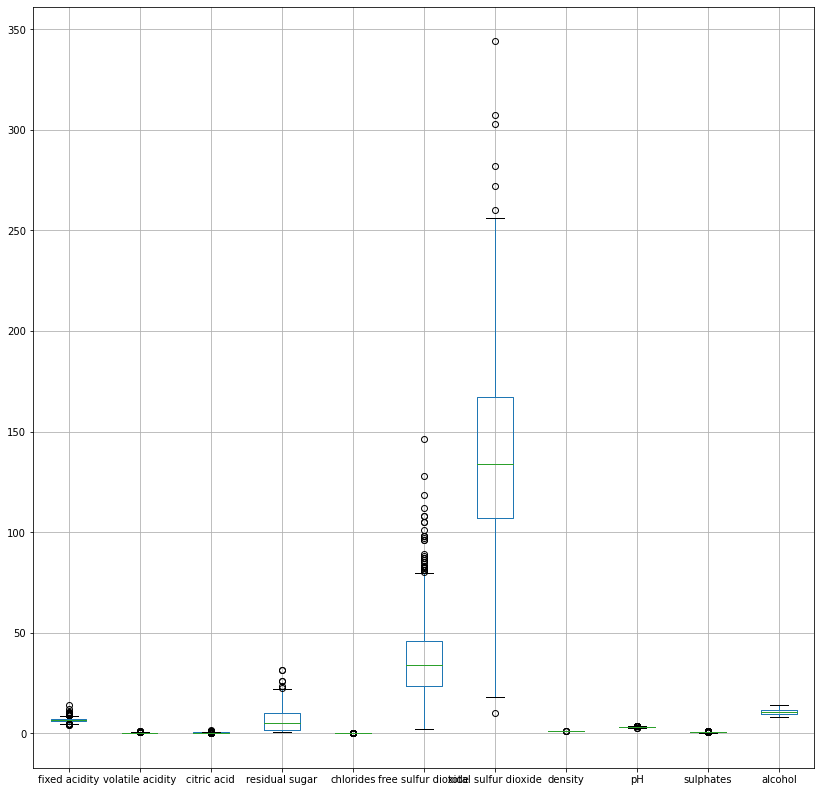

In [469]:
X_train.boxplot(figsize=(14,14))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f57163ce350>,
      dtype=object)

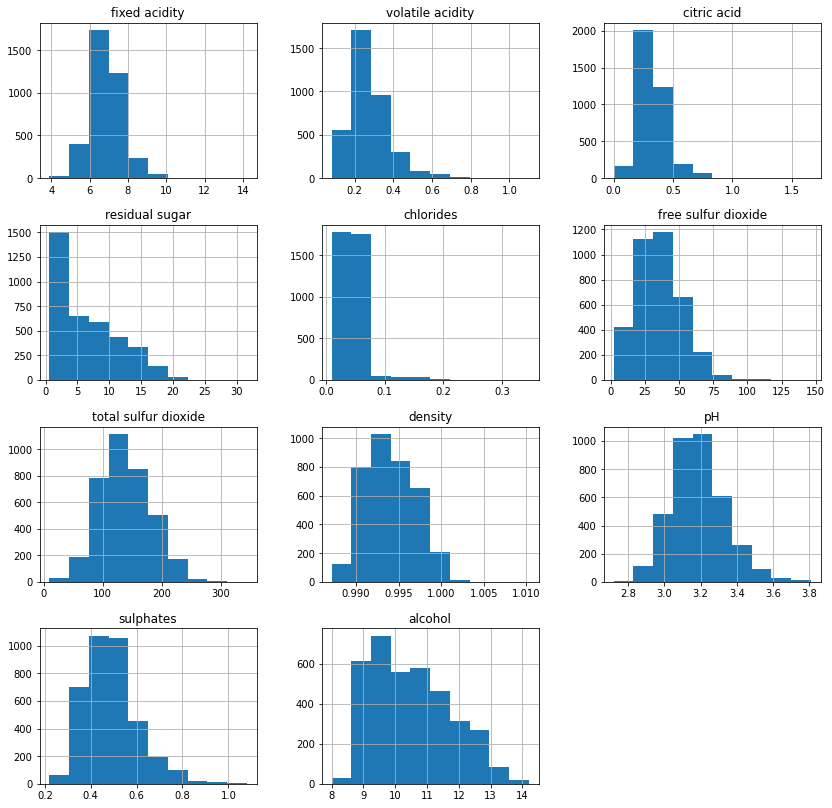

In [470]:
X_train.hist(figsize=(14,14))

In [471]:
from sklearn.preprocessing import RobustScaler

transformer = RobustScaler().fit(X_train)

X_train_transformed = transformer.transform(X_train)
X_test_transformed = transformer.transform(X_test)

df_X_train_transformed = pd.DataFrame(X_train_transformed, columns=X_train.columns)
df_X_test_transformed = pd.DataFrame(X_test_transformed, columns=X_test.columns)

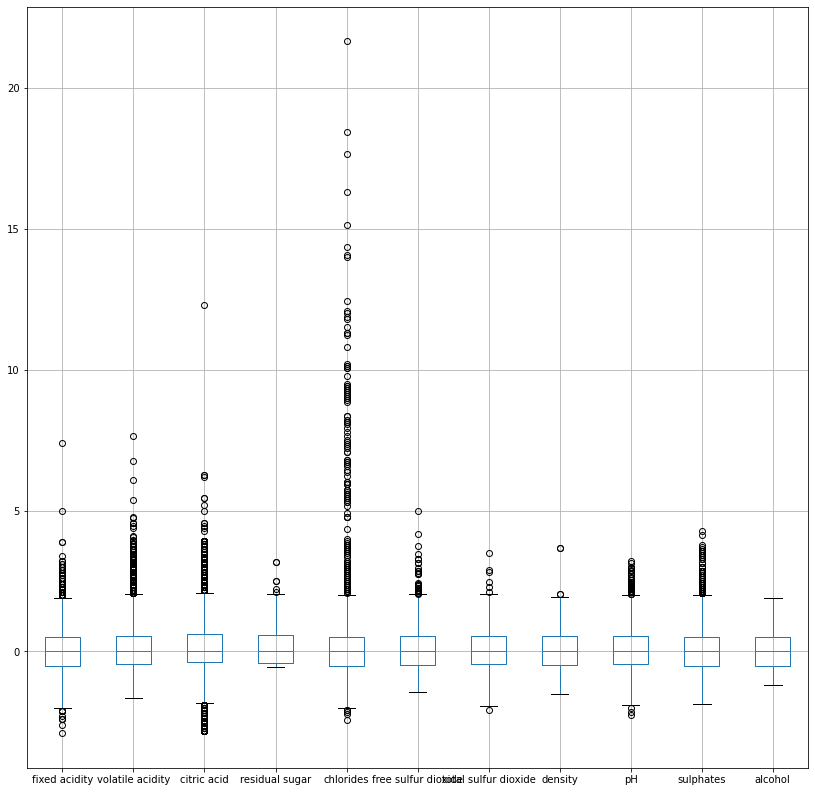

In [472]:
df_X_train_transformed.boxplot(figsize=(14,14))

For 2 number of clusters, the average Silhouette score is 0.622643049113884
For 3 number of clusters, the average Silhouette score is 0.18078273407638193
For 4 number of clusters, the average Silhouette score is 0.13934042726071302
For 5 number of clusters, the average Silhouette score is 0.13435530642307325
For 6 number of clusters, the average Silhouette score is 0.14051553870343989
For 7 number of clusters, the average Silhouette score is 0.13144280674158154
For 8 number of clusters, the average Silhouette score is 0.1299618337226869
For 9 number of clusters, the average Silhouette score is 0.12779967095344416
For 10 number of clusters, the average Silhouette score is 0.12005449724381363
For 11 number of clusters, the average Silhouette score is 0.11319877925248942
For 12 number of clusters, the average Silhouette score is 0.10981552083938559
For 13 number of clusters, the average Silhouette score is 0.10984053121842759
For 14 number of clusters, the average Silhouette score is 0.11

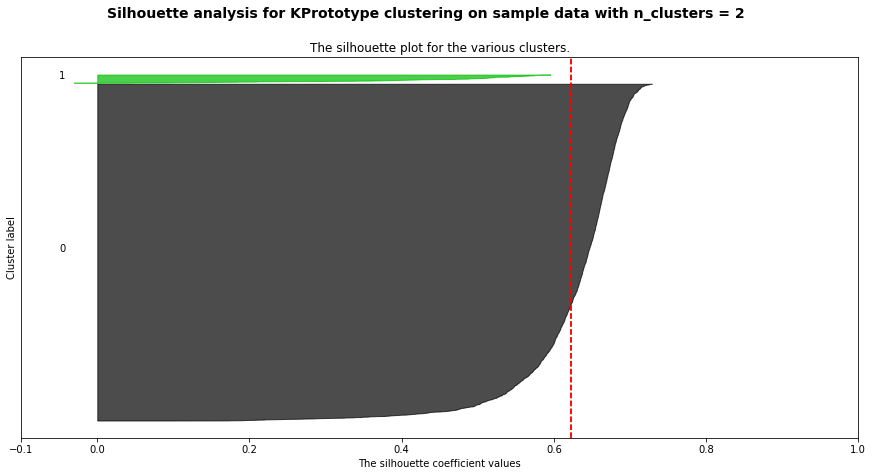

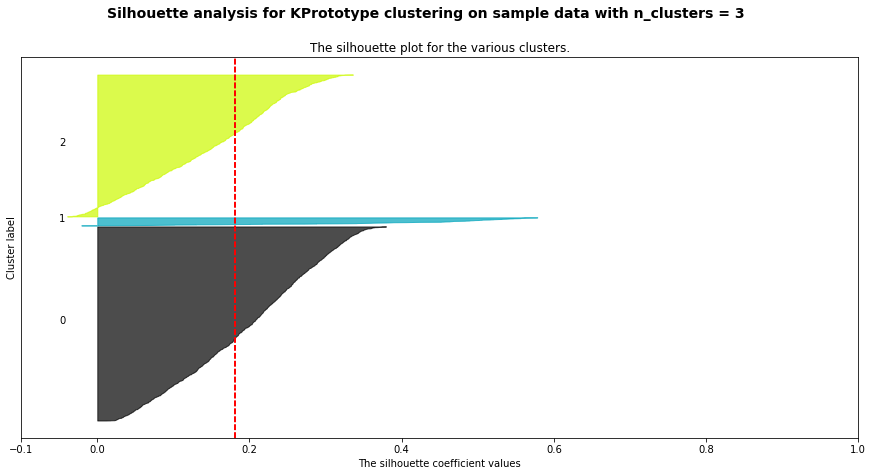

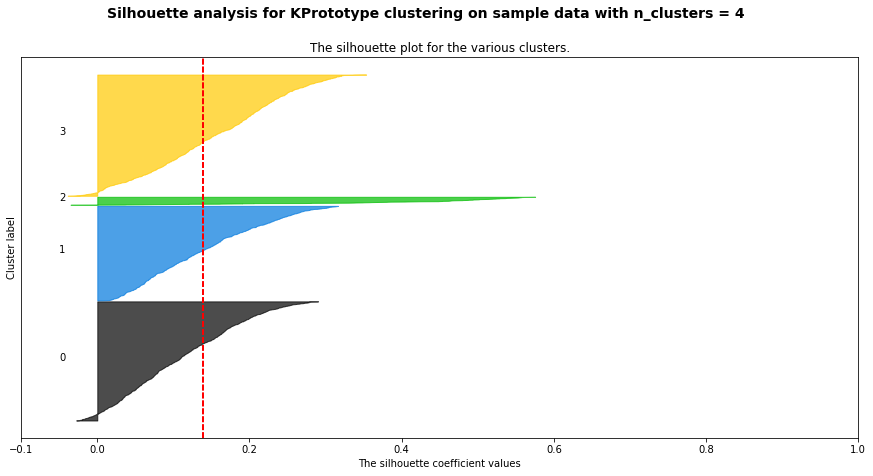

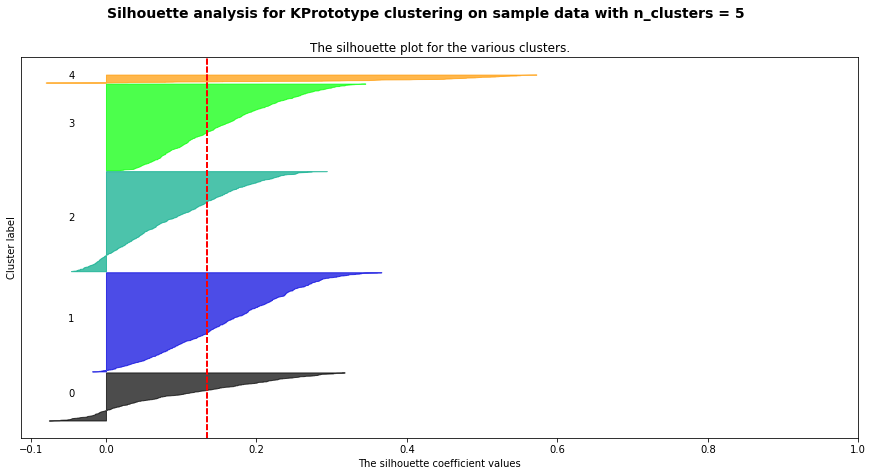

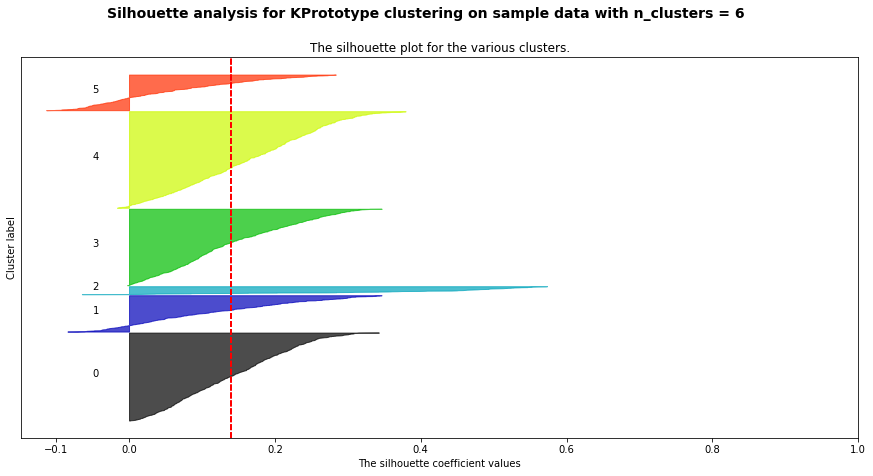

...

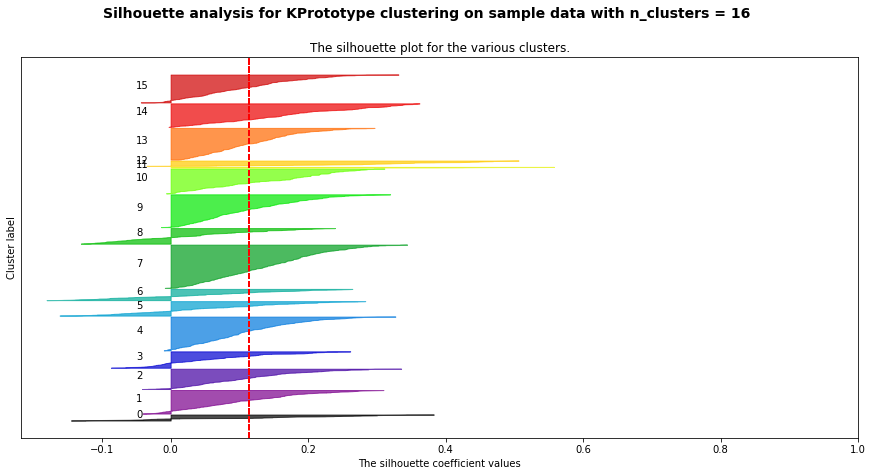

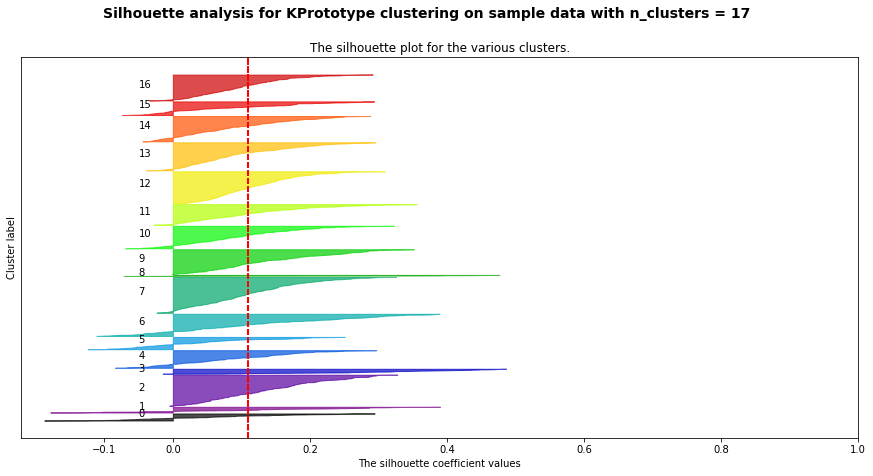

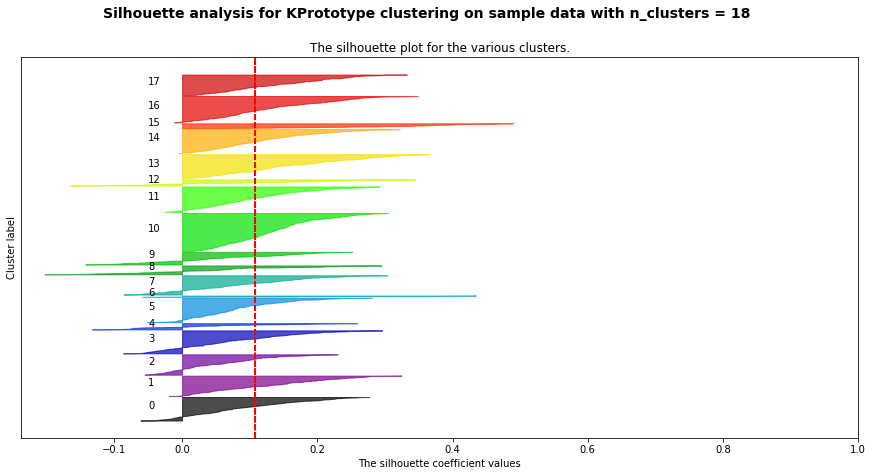

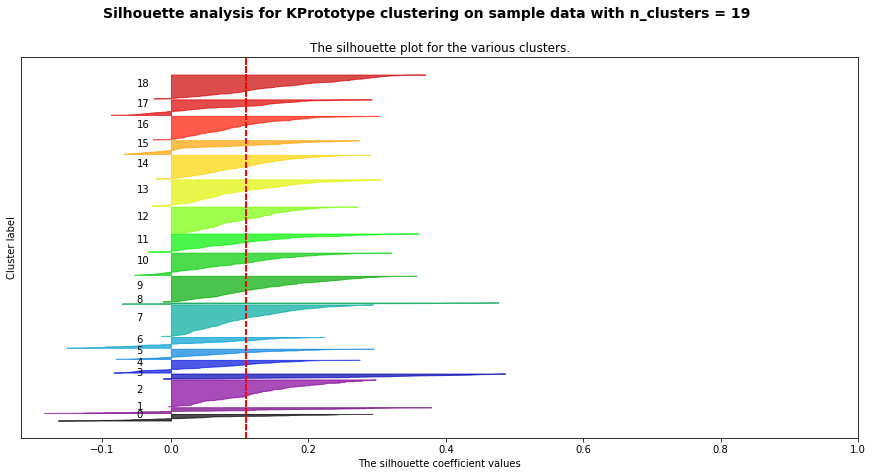

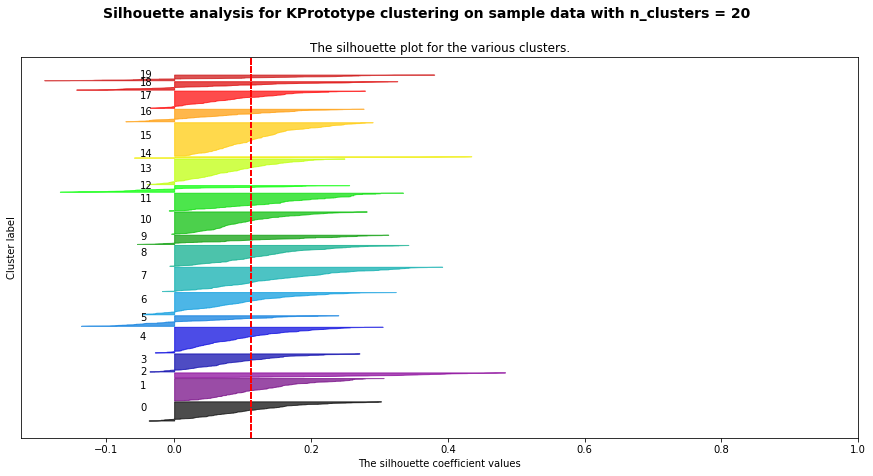

In [473]:
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style
from time import time

training_time_kmeans = []
elbow_lost = []
silhouette_avg_list = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters = cluster, random_state= 0)
    t_0 = time()
    cluster_labels = kmeans.fit_predict(df_X_train_transformed)
    training_time_kmeans.append(time() - t_0)

    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed 
    #clusters

    silhouette_avg = silhouette_score(df_X_train_transformed, cluster_labels)
    silhouette_avg_list.append(silhouette_avg)
    elbow_lost.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_X_train_transformed, cluster_labels)
    
    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

      ith_cluster_silhouette_values.sort()

      size_cluster_i = ith_cluster_silhouette_values.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4) 
      
      
plt.show()

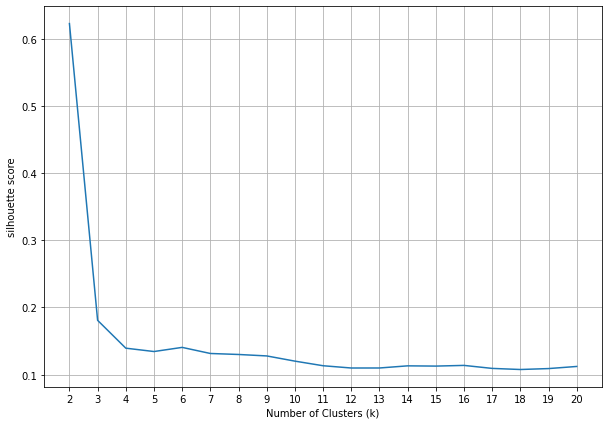

In [474]:
from matplotlib.pyplot import figure
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), silhouette_avg_list)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.xticks(range(2,21))
plt.show()

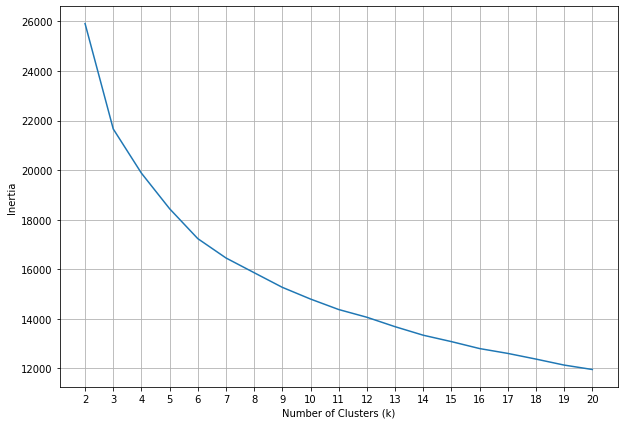

In [475]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), elbow_lost)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [476]:
# Choosing K = 5 according to silhouette and Elbow method

kmeans_optimal = KMeans(n_clusters= 5, random_state= 0)
kmeans_optimal.fit(df_X_train_transformed)
cluster_labels_kmeans_optimal = kmeans_optimal.predict(df_X_train_transformed)

In [477]:
df_X_train_viz = X_train.copy()
df_X_train_viz['Cluster Labels'] = cluster_labels_kmeans_optimal
df_X_train_viz['Total'] = cluster_labels_kmeans_optimal

In [478]:
df_X_train_viz.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Cluster Labels,Total
2483,6.3,0.27,0.37,7.9,0.047,58.0,215.0,0.99542,3.19,0.48,9.5,1,1
1256,7.3,0.18,0.65,1.4,0.046,28.0,157.0,0.99460,3.33,0.62,9.4,0,0
3379,7.6,0.36,0.49,11.3,0.046,87.0,221.0,0.99840,3.01,0.43,9.2,0,0
2171,7.4,0.19,0.30,12.8,0.053,48.5,229.0,0.99860,3.14,0.49,9.1,1,1
2248,7.4,0.20,0.29,1.7,0.047,16.0,100.0,0.99243,3.28,0.45,10.6,3,3


In [479]:
# Intrepratation of each cluster, by taking means for continous variables and mode for categorical variables

df_X_train_viz.groupby('Cluster Labels').agg(
  {
    'fixed acidity': 'mean',
    'volatile acidity': 'mean',
    'citric acid': 'mean',
    'residual sugar': 'mean',
    'chlorides': 'mean',
    'free sulfur dioxide': 'mean',
    'total sulfur dioxide': 'mean',
    'density': 'mean',
    'pH': 'mean',
    'sulphates': 'mean',
    'alcohol': 'mean',
    'Total': 'count' 
  }
).reset_index()

,Cluster Labels,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Total
0,0,7.081818,0.292224,0.512979,10.343810,0.047619,46.710832,173.142166,0.996767,3.146615,0.537311,9.585300,517
1,1,6.893146,0.272423,0.277869,10.044930,0.051101,42.078873,164.005164,0.996486,3.181033,0.483221,9.595274,1065
2,2,6.162419,0.293474,0.274986,3.402465,0.037773,30.117209,117.008837,0.991749,3.290828,0.507042,11.312605,1075
3,3,7.495694,0.255533,0.355770,3.737729,0.038184,26.700215,111.876211,0.992345,3.103735,0.454403,11.200179,929
4,4,6.677586,0.311954,0.437701,4.697126,0.164897,40.270115,145.045977,0.994414,3.100920,0.463908,9.570115,87


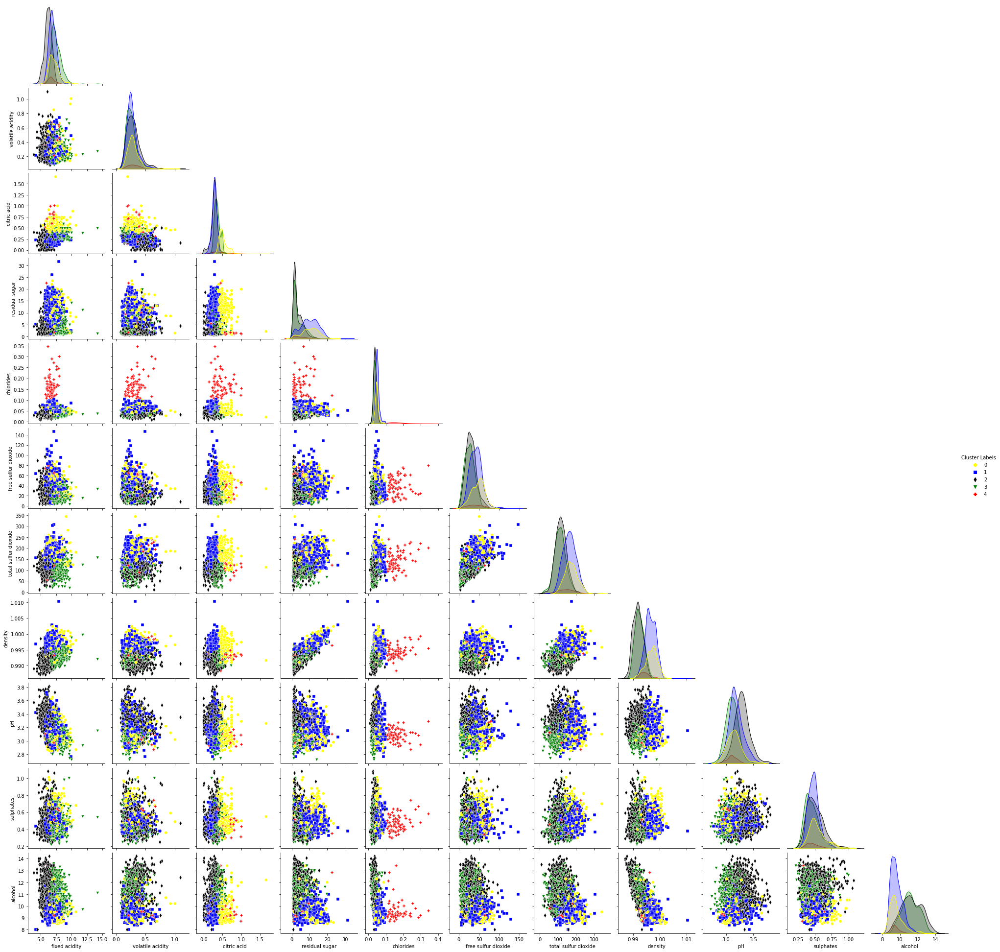

In [480]:
import seaborn as sns

sns.pairplot(df_X_train_viz.drop(['Total'], axis=1), hue = 'Cluster Labels', palette= ['yellow', 'blue', 'black', 'green', 'red'], markers=['o', 's', 'd', 'v', 'P'], corner = True)

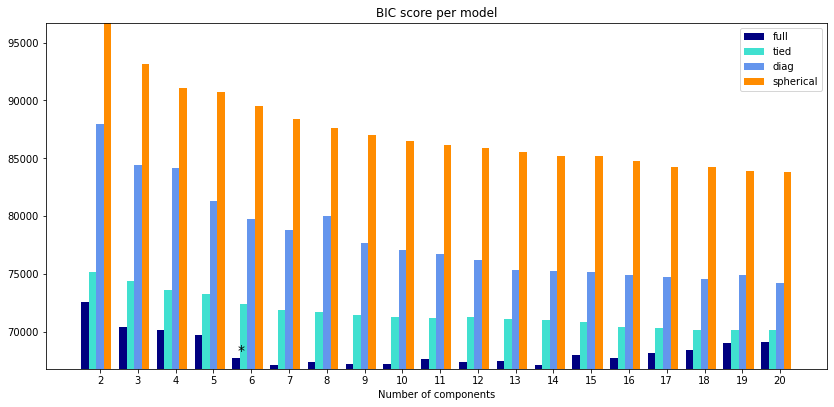

In [496]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
training_time_em = []
lowest_bic = np.infty
bic = []
n_components_range = range(2, 21)
cv_types = ["full", "tied", "diag", "spherical"]
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        t_0_em = time()
        gmm.fit(df_X_train_transformed)
        training_time_em.append(time() - t_0_em)
        bic.append(gmm.bic(df_X_train_transformed))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + 0.2 * (i - 2)
    bars.append(
        plt.bar(
            xpos,
            bic[i * len(n_components_range) : (i + 1) * len(n_components_range)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - 0.01 * bic.max(), bic.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic.argmin(), len(n_components_range))
    + 0.65
    + 0.2 * np.floor(bic.argmin() / len(n_components_range))
)
plt.text(xpos, bic.min() * 0.97 + 0.03 * bic.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars], cv_types)

In [482]:
# Choosing K=7 and covariance of "FULL" based on BIC score

gmm_optimal = mixture.GaussianMixture(n_components= 7, covariance_type="full", random_state= 0)
gmm_optimal.fit(df_X_train_transformed)
cluster_labels_em = gmm_optimal.predict(df_X_train_transformed)

In [483]:
df_X_train_viz_gmm = X_train.copy()
df_X_train_viz_gmm['Cluster Labels'] = cluster_labels_em
df_X_train_viz_gmm['Total'] = cluster_labels_em

In [484]:
df_X_train_viz_gmm.groupby('Cluster Labels').agg(
  {
    'fixed acidity': 'mean',
    'volatile acidity': 'mean',
    'citric acid': 'mean',
    'residual sugar': 'mean',
    'chlorides': 'mean',
    'free sulfur dioxide': 'mean',
    'total sulfur dioxide': 'mean',
    'density': 'mean',
    'pH': 'mean',
    'sulphates': 'mean',
    'alcohol': 'mean',
    'Total': 'count' 
  }
).reset_index()

,Cluster Labels,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Total
0,0,6.844924,0.249680,0.282323,11.097010,0.050089,37.294854,159.009040,0.997020,3.198234,0.468526,9.437112,719
1,1,7.288889,0.477778,0.367778,9.144444,0.266333,38.888889,192.111111,0.997018,3.053333,0.564444,9.422222,9
2,2,7.074419,0.399884,0.336246,7.221927,0.041478,27.063123,123.574751,0.994357,3.222458,0.516312,10.996678,301
3,3,6.607967,0.349698,0.413132,5.588736,0.104868,36.532967,154.532967,0.994718,3.144011,0.474176,9.630311,182
4,4,6.831250,0.281368,0.413801,10.376689,0.045627,52.630912,174.735642,0.996473,3.127855,0.539510,9.547269,592
5,5,6.761456,0.284086,0.315260,5.381433,0.036134,31.681716,118.375847,0.991982,3.178352,0.451061,11.649059,886
6,6,6.928506,0.238948,0.323526,1.444411,0.041117,28.922764,118.713923,0.992012,3.220020,0.505386,10.840786,984


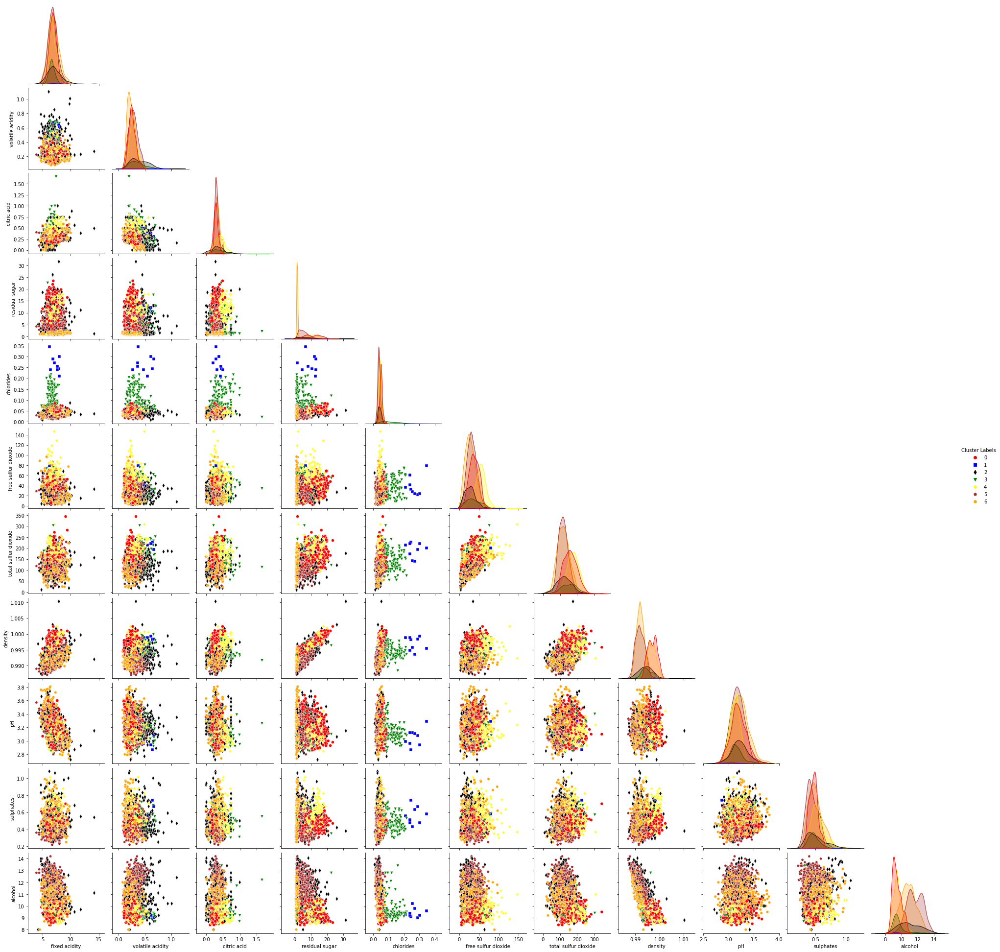

In [485]:
sns.pairplot(df_X_train_viz_gmm.drop(['Total'], axis=1), hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h'], corner = True)

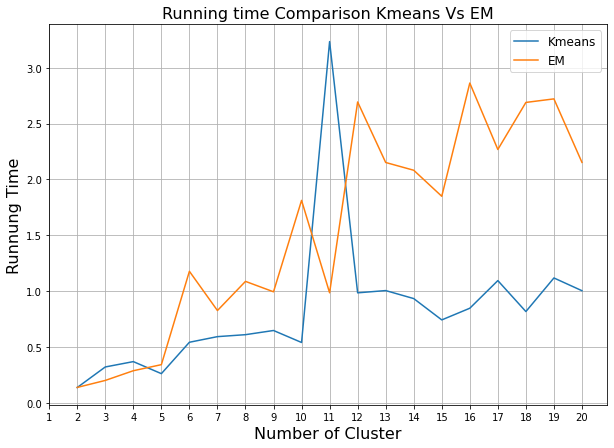

In [504]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), training_time_kmeans, label= 'Kmeans')
plt.plot(range(2,21), training_time_em[:19], label= 'EM')
plt.xticks(range(1,21))
plt.xlabel('Number of Cluster', fontsize=16)
plt.ylabel('Runnung Time', fontsize=16)
plt.title('Running time Comparison Kmeans Vs EM', fontsize=16)
plt.legend(fontsize=12)

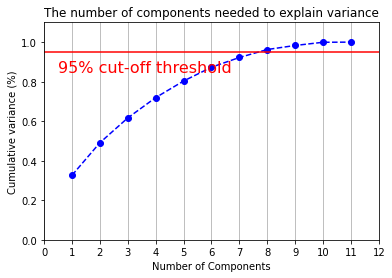

In [505]:
from sklearn.decomposition import PCA

training_time_pca = []
n_components = df_X_train_transformed.shape[1]
explained_variance = []

for components in range(1, df_X_train_transformed.shape[1] + 1):
  pca = PCA(n_components = components, random_state =0)
  t_0_pca = time()
  pca.fit(df_X_train_transformed)
  training_time_pca.append(time() - t_0_pca)
  explained_variance.append(np.cumsum(pca.explained_variance_ratio_))

fig, ax = plt.subplots()
xi = np.arange(1, n_components+1, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_components+2, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [14]:
# Choosing 7 components out of 11 features to be able to explain 94% of variations in data

pca_optimal = PCA(n_components= 7, random_state= 0)
pca_optimal.fit(df_X_train_transformed)
pca_reduced = pca_optimal.transform(df_X_train_transformed)
pca_reduced_X_test = pca_optimal.transform(df_X_test_transformed)

In [15]:
df_pca_reduced = pd.DataFrame(pca_reduced, columns = ['PC1', 'PC2', 'PC3', 'PC4',
                                                      'PC5', 'PC6', 'PC7'])

**NN With PCAs Componenets** 

In [16]:
## NN Model For PCA 
X_train_pca, X_val_pca, y_train_pca, y_val_pca = train_test_split(df_pca_reduced, y_train, test_size=0.15, stratify= y_train)

In [17]:
print(y_train_pca.value_counts())
print(y_val_pca.value_counts())
print(y_test.value_counts())

6    1401
5     929
7     561
8     111
4     104
3      13
9       3
Name: quality, dtype: int64
6    247
5    164
7     99
8     20
4     18
3      2
9      1
Name: quality, dtype: int64
6    550
5    364
7    220
8     44
4     41
3      5
9      1
Name: quality, dtype: int64


In [18]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_pca)
y_val_tra = le.transform(y_val_pca)
y_test_tra = le.transform(y_test)

In [19]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f588d94d590>,
      dtype=object)

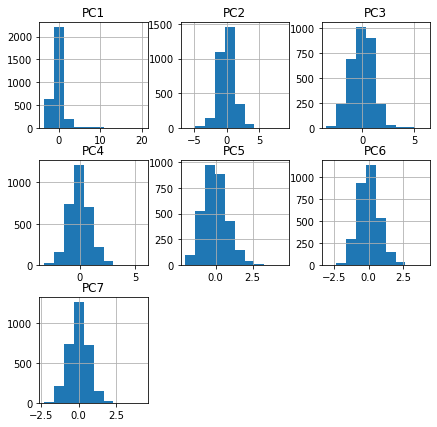

In [20]:
X_train_pca.hist(figsize=(7,7))

In [21]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score
from sklearn.utils import resample
import numpy as np

In [23]:
def check_accuracy(loader, model):
  num_correct = 0
  num_samples = 0
  precision_list = []
  recall_list = []
  f1_score_list = []
  model.eval()

  with torch.no_grad():
    for x, y_true in loader:
      x = x.to(device = device)
      y = y_true.to(device = device)

      scores = model.forward(x.float())
      _, y_pred = scores.max(1)
      y_pred = y_pred.to(y_true.device)

      # tp = (y_true * y_pred).sum()
      # tn = ((1 - y_true) * (1 - y_pred)).sum()
      # fp = ((1 - y_true) * y_pred).sum()
      # fn = (y_true * (1 - y_pred)).sum()

      # epsilon = 1e-7
          
      precision = precision_score(y_true, y_pred, average='macro', zero_division=1)
      precision_list.append(precision.tolist())
      recall = recall_score(y_pred, y_true, average='macro', zero_division=1)
      recall_list.append(recall.tolist())
      f1 = f1_score(y_true, y_pred, average='macro', zero_division=1)
      f1_score_list.append(f1.tolist())

      num_correct += (y_pred == y_true).sum()
      num_samples += y_pred.size(0)
  
  return np.mean(f1_score_list)

In [24]:
def check_classification_report(loader, model):
  num_correct = 0
  num_samples = 0
  precision_list = []
  recall_list = []
  f1_score_list = []
  model.eval()

  with torch.no_grad():
    for x, y_true in loader:
      x = x.to(device = device)
      y = y_true.to(device = device)

      scores = model.forward(x.float())
      _, y_pred = scores.max(1)
      y_pred = y_pred.to(y_true.device)

      # tp = (y_true * y_pred).sum()
      # tn = ((1 - y_true) * (1 - y_pred)).sum()
      # fp = ((1 - y_true) * y_pred).sum()
      # fn = (y_true * (1 - y_pred)).sum()

      # epsilon = 1e-7
          
      precision = precision_score(y_true, y_pred, average='macro', zero_division=1)
      precision_list.append(precision.tolist())
      recall = recall_score(y_pred, y_true, average='macro', zero_division=1)
      recall_list.append(recall.tolist())
      f1 = f1_score(y_true, y_pred, average='macro', zero_division=1)
      f1_score_list.append(f1.tolist())

      num_correct += (y_pred == y_true).sum()
      num_samples += y_pred.size(0)
  
  print(f'Got {num_correct} / {num_samples} with accuracy of {float(num_correct)/ float(num_samples)*100:.2f}')
  print(f'Average Precision Score: {np.mean(precision_list):.2f}')
  print(f'Average recall Score: {np.mean(recall_list):.2f}')
  print(f'Average f1-Score: {np.mean(f1_score_list):.2f}')

In [25]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [26]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [27]:
#Hyperparameters
input_size = X_train_pca.shape[1]
num_classes = 7
hidden_layer = 50
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [28]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_pca.values)
X_val_tensor = torch.tensor(X_val_pca.values)
X_test_tensor = torch.tensor(pca_reduced_X_test)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [29]:
train_data_pca = TensorDataset(X_train_tensor, y_train_tensor)
val_data_pca = TensorDataset(X_val_tensor, y_val_tensor)
test_data_pca = TensorDataset(X_test_tensor, y_test_tensor) 

In [30]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_pca, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_pca, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_pca, batch_size = batch_size)

In [31]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [34]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [512]:
training_time_nn_pca = []
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  t_0_nn_pca = time()
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  training_time_nn_pca.append(time() - t_0_nn_pca)
  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 1.22
Batch # 1 Loss: 1.00
Batch # 2 Loss: 1.20
Batch # 3 Loss: 0.96
Batch # 4 Loss: 1.13
Batch # 5 Loss: 1.29
Batch # 6 Loss: 1.08
Batch # 7 Loss: 1.02
Batch # 8 Loss: 1.30
Batch # 9 Loss: 0.98
Batch # 10 Loss: 1.26
Batch # 11 Loss: 1.22
Batch # 12 Loss: 1.42
Batch # 13 Loss: 1.20
Batch # 14 Loss: 1.01
Batch # 15 Loss: 0.90
Batch # 16 Loss: 1.08
Batch # 17 Loss: 1.09
Batch # 18 Loss: 1.08
Batch # 19 Loss: 0.97
Batch # 20 Loss: 1.21
Batch # 21 Loss: 1.59
Batch # 22 Loss: 0.94
Batch # 23 Loss: 1.16
Batch # 24 Loss: 1.01
Batch # 25 Loss: 1.27
Batch # 26 Loss: 1.06
Batch # 27 Loss: 0.95
Batch # 28 Loss: 1.24
Batch # 29 Loss: 1.06
Batch # 30 Loss: 1.37
Batch # 31 Loss: 1.35
Batch # 32 Loss: 1.10
Batch # 33 Loss: 1.11
Batch # 34 Loss: 1.12
Batch # 35 Loss: 0.85
Batch # 36 Loss: 1.15
Batch # 37 Loss: 1.09
Batch # 38 Loss: 1.02
Batch # 39 Loss: 1.27
Batch # 40 Loss: 1.18
Batch # 41 Loss: 1.15
Batch # 42 Loss: 1.36
Batch # 43 Loss: 1.23
Batch # 44 Loss: 1.03
Batch # 45 Loss: 1.3

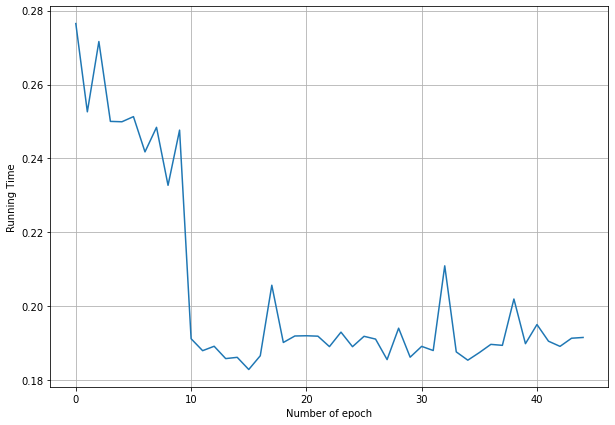

In [513]:
from matplotlib.pyplot import figure

figure(figsize=(10,7))
plt.grid()
plt.plot(range(45), training_time_nn_pca)
plt.xlabel("Number of epoch")
plt.ylabel("Running Time")
plt.show()

In [36]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

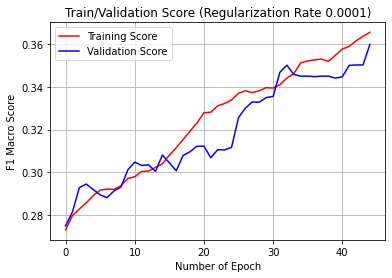

In [37]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [39]:
check_classification_report(test_data_load, model)

Got 644 / 1225 with accuracy of 52.57
Average Precision Score: 0.68
Average recall Score: 0.68
Average f1-Score: 0.33


In [40]:
check_classification_report(train_data_load, model)

Got 1741 / 3122 with accuracy of 55.77
Average Precision Score: 0.69
Average recall Score: 0.69
Average f1-Score: 0.37


For 2 number of clusters, the average Silhouette score is 0.6417221067724764
For 3 number of clusters, the average Silhouette score is 0.19903680805289198
For 4 number of clusters, the average Silhouette score is 0.15543421639452878
For 5 number of clusters, the average Silhouette score is 0.15235750356615874
For 6 number of clusters, the average Silhouette score is 0.1599190556644933
For 7 number of clusters, the average Silhouette score is 0.15189188290577324
For 8 number of clusters, the average Silhouette score is 0.15160061897201696
For 9 number of clusters, the average Silhouette score is 0.13263291545696818
For 10 number of clusters, the average Silhouette score is 0.1300002603150996
For 11 number of clusters, the average Silhouette score is 0.12366267250825225
For 12 number of clusters, the average Silhouette score is 0.12225221599995711
For 13 number of clusters, the average Silhouette score is 0.12259247824206052
For 14 number of clusters, the average Silhouette score is 0.12

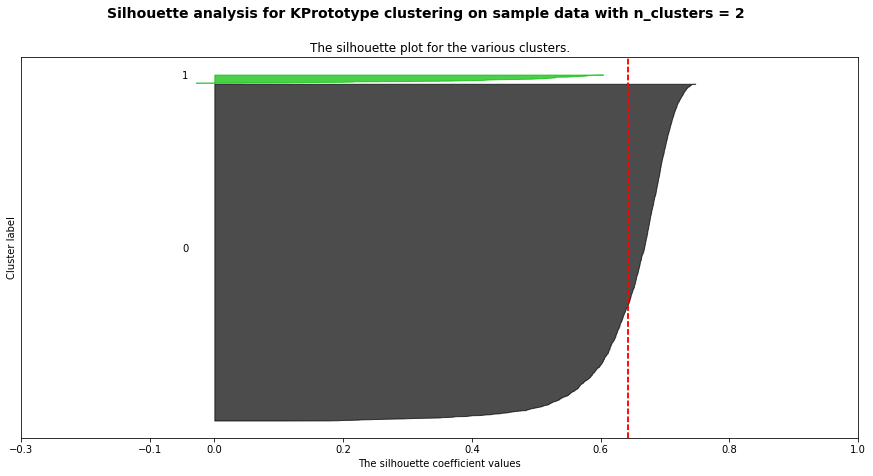

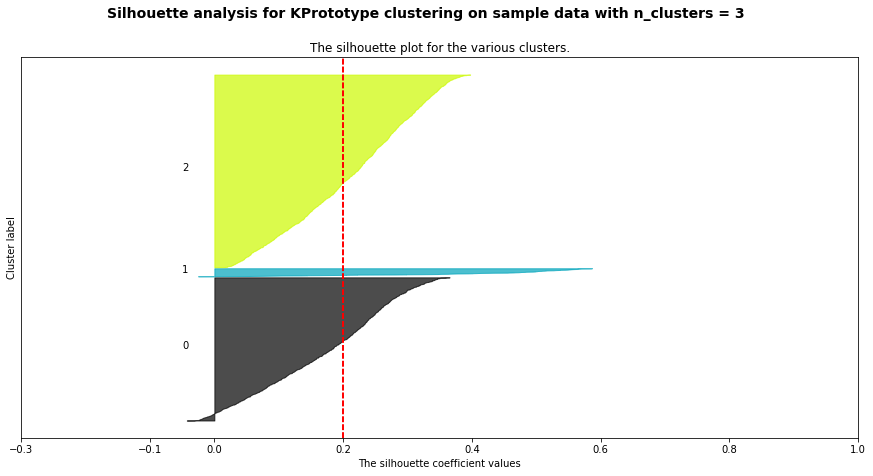

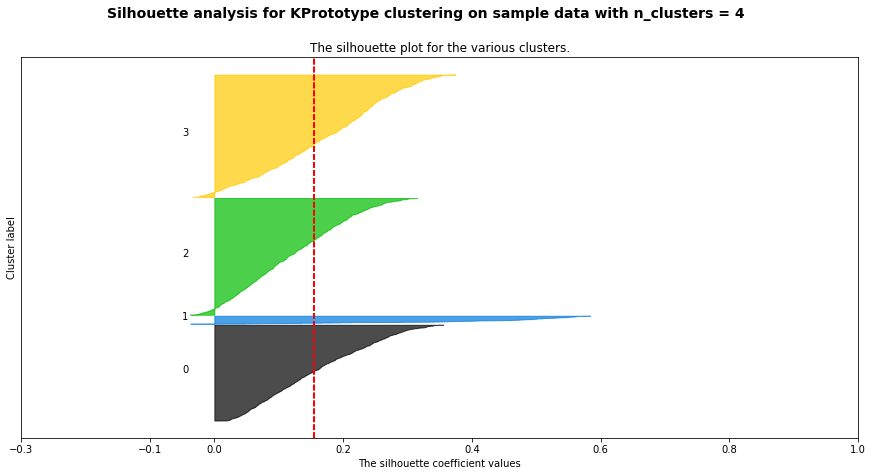

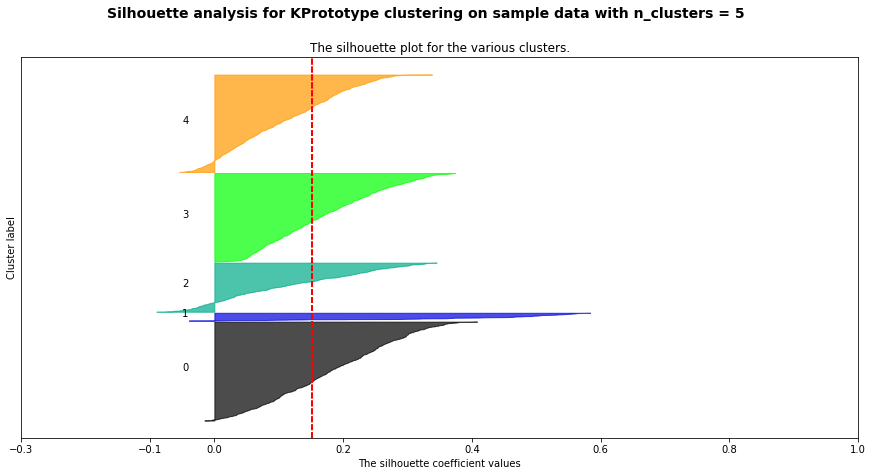

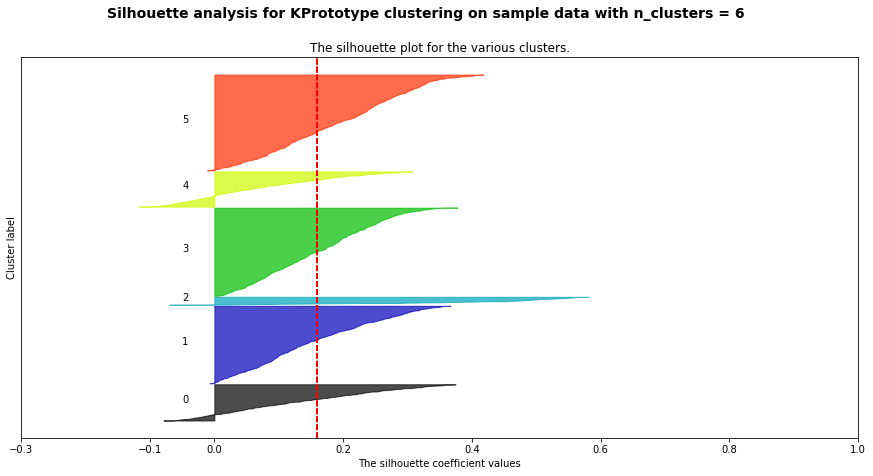

...

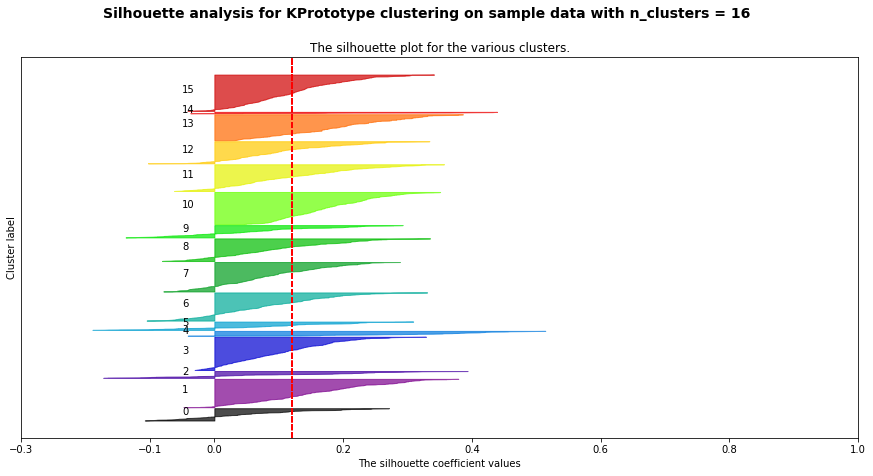

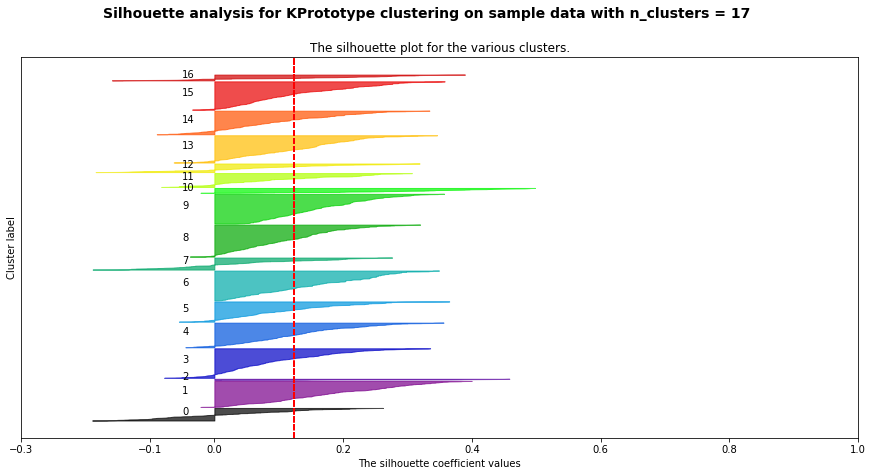

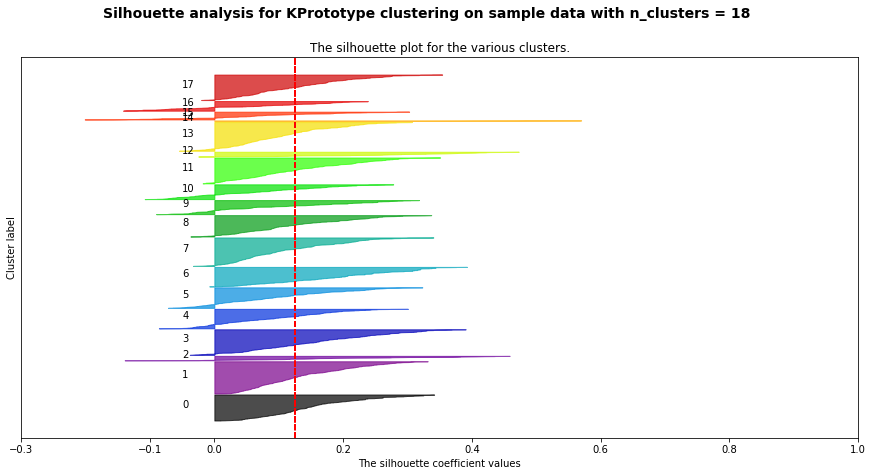

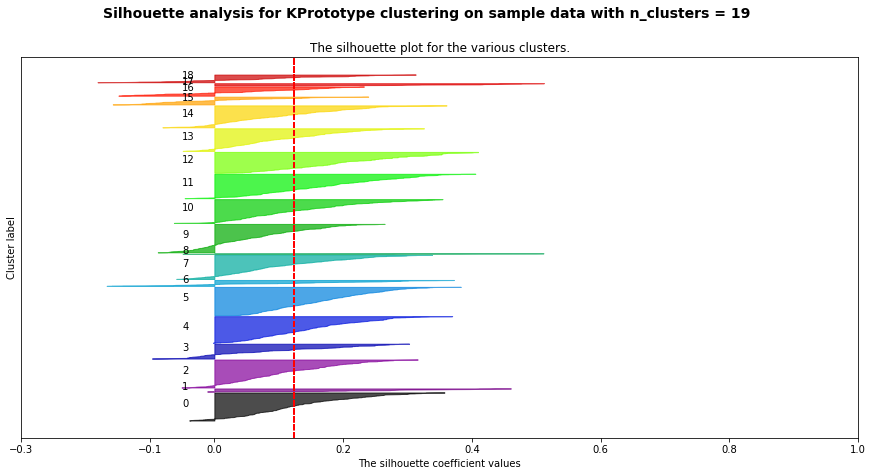

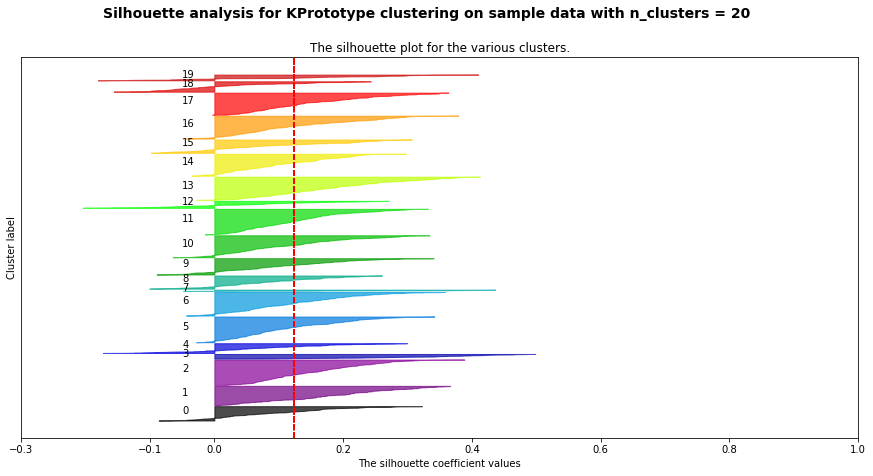

In [42]:
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_pca = []
silhouette_avg_list_pca = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_pca = kmeans.fit_predict(df_pca_reduced)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed 
    #clusters

    silhouette_avg_pca = silhouette_score(df_pca_reduced, cluster_labels_pca)
    silhouette_avg_list_pca.append(silhouette_avg_pca)
    elbow_lost_pca.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_pca}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_pca = silhouette_samples(df_pca_reduced, cluster_labels_pca)
    
    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_pca = \
            sample_silhouette_values_pca[cluster_labels_pca == i]

      ith_cluster_silhouette_values_pca.sort()

      size_cluster_i = ith_cluster_silhouette_values_pca.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_pca,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_pca, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4) 
      
      
plt.show()

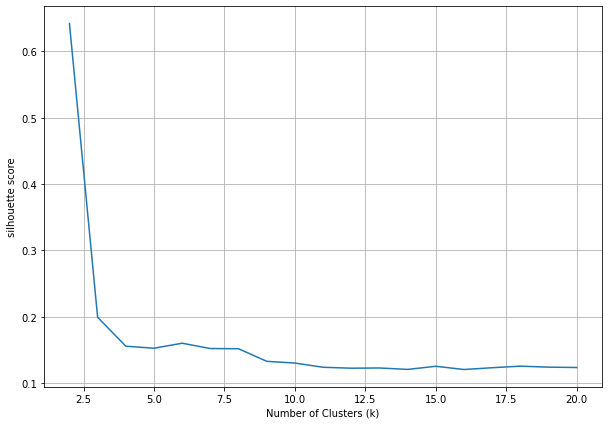

In [44]:
from matplotlib.pyplot import figure

figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), silhouette_avg_list_pca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

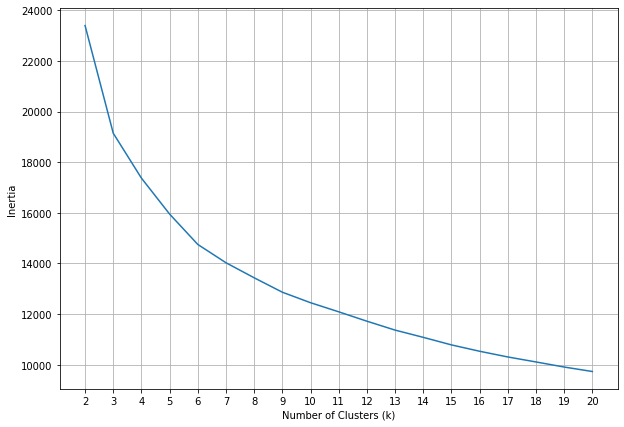

In [45]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), elbow_lost_pca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [46]:
#Choosing K=3 based on Silhouette Score

kmeans_optimal_pca = KMeans(n_clusters= 3, random_state= 0)
kmeans_optimal_pca.fit(df_pca_reduced)
cluster_labels_pca_optimal = kmeans_optimal_pca.predict(df_pca_reduced)

In [47]:
df_pca_reduced_viz = df_pca_reduced.copy()
df_pca_reduced_viz['Cluster Labels'] = cluster_labels_pca_optimal

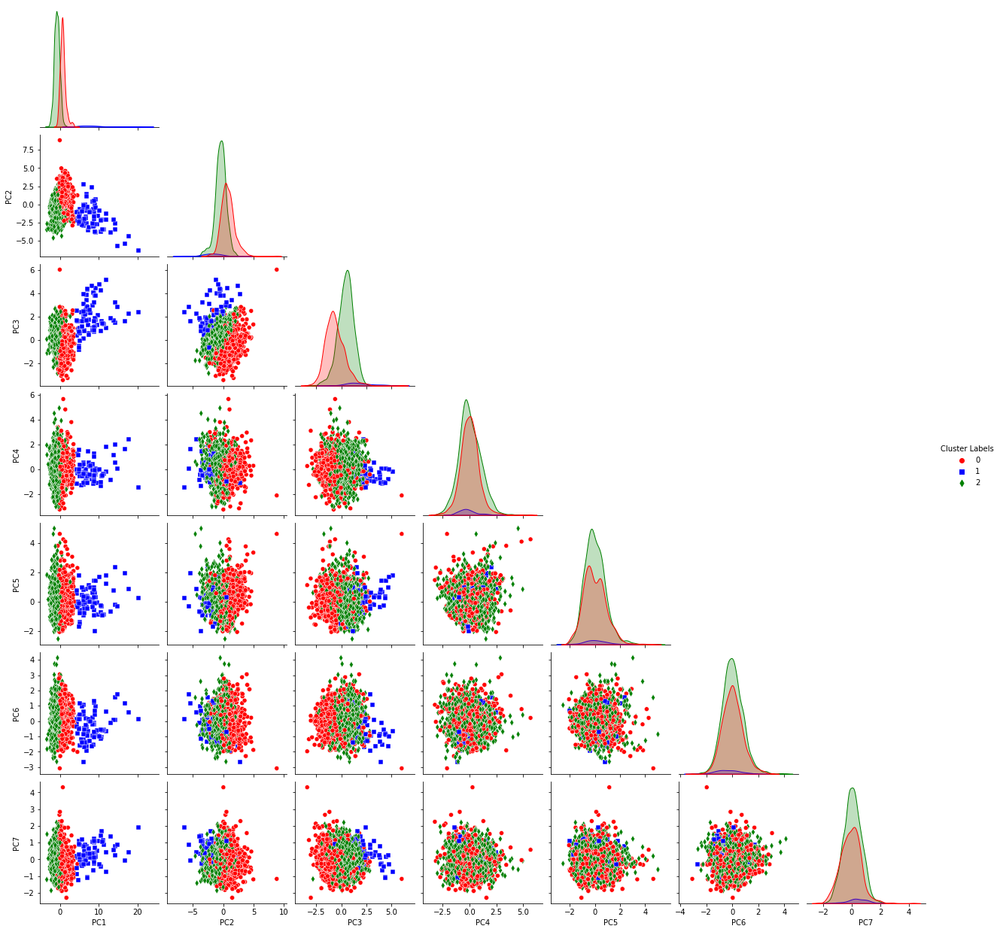

In [ ]:
sns.pairplot(df_pca_reduced_viz, hue = 'Cluster Labels', palette= ['r', 'blue', 'g'], markers=['o', 's', 'd'], corner = True)

In [ ]:
df_pca_reduced_viz_org = df_X_train_transformed.copy()
df_pca_reduced_viz_org['Cluster Labels'] = cluster_labels_pca_optimal

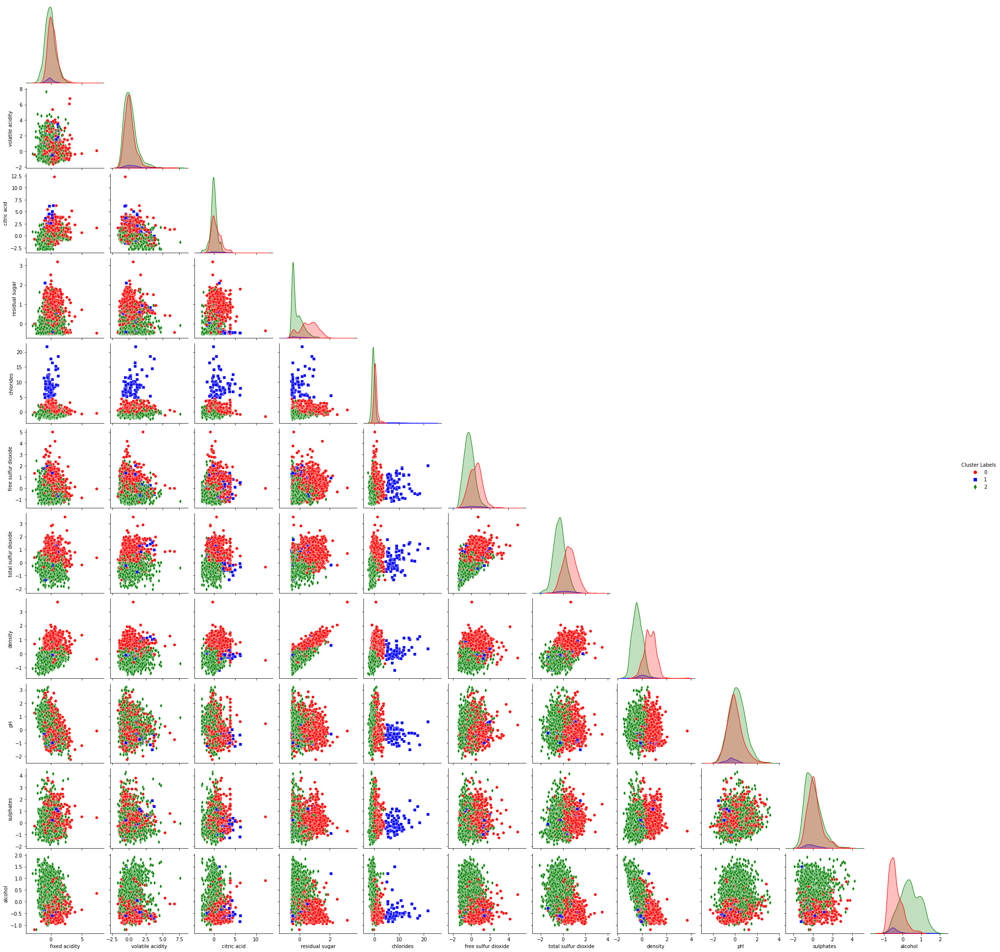

In [ ]:
sns.pairplot(df_pca_reduced_viz_org, hue = 'Cluster Labels', palette= ['r', 'blue', 'g'], markers=['o', 's', 'd'], corner = True)

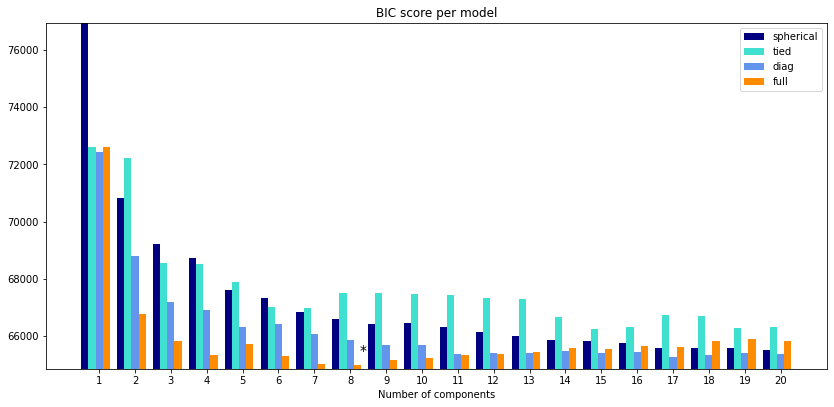

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_pca = np.infty
bic_pca = []
n_components_range_pca = range(1, 21)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_pca:
        # Fit a Gaussian mixture with EM
        gmm_pca = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_pca.fit(df_pca_reduced)
        bic_pca.append(gmm_pca.bic(df_pca_reduced))
        if bic_pca[-1] < lowest_bic_pca:
            lowest_bic_pca = bic_pca[-1]
            best_gmm_pca = gmm_pca

bic_pca = np.array(bic_pca)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_pca = best_gmm_pca
bars_pca = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_pca) + 0.2 * (i - 2)
    bars_pca.append(
        plt.bar(
            xpos,
            bic_pca[i * len(n_components_range_pca) : (i + 1) * len(n_components_range_pca)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_pca)
plt.ylim([bic_pca.min() * 1.01 - 0.01 * bic_pca.max(), bic_pca.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_pca.argmin(), len(n_components_range_pca))
    + 0.65
    + 0.2 * np.floor(bic_pca.argmin() / len(n_components_range_pca))
)
plt.text(xpos, bic_pca.min() * 0.97 + 0.03 * bic_pca.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_pca], cv_types)

In [50]:
# Choosing K=8 and covariance of "FULL" based on BIC score

gmm_optimal_pca = mixture.GaussianMixture(n_components= 8, covariance_type="full", random_state= 0)
gmm_optimal_pca.fit(df_pca_reduced)
cluster_labels_pca_optimal_gmm = gmm_optimal_pca.predict(df_pca_reduced)

In [51]:
df_pca_reduced_gmm_viz = df_pca_reduced.copy()
df_pca_reduced_gmm_viz['Cluster Labels'] = cluster_labels_pca_optimal_gmm

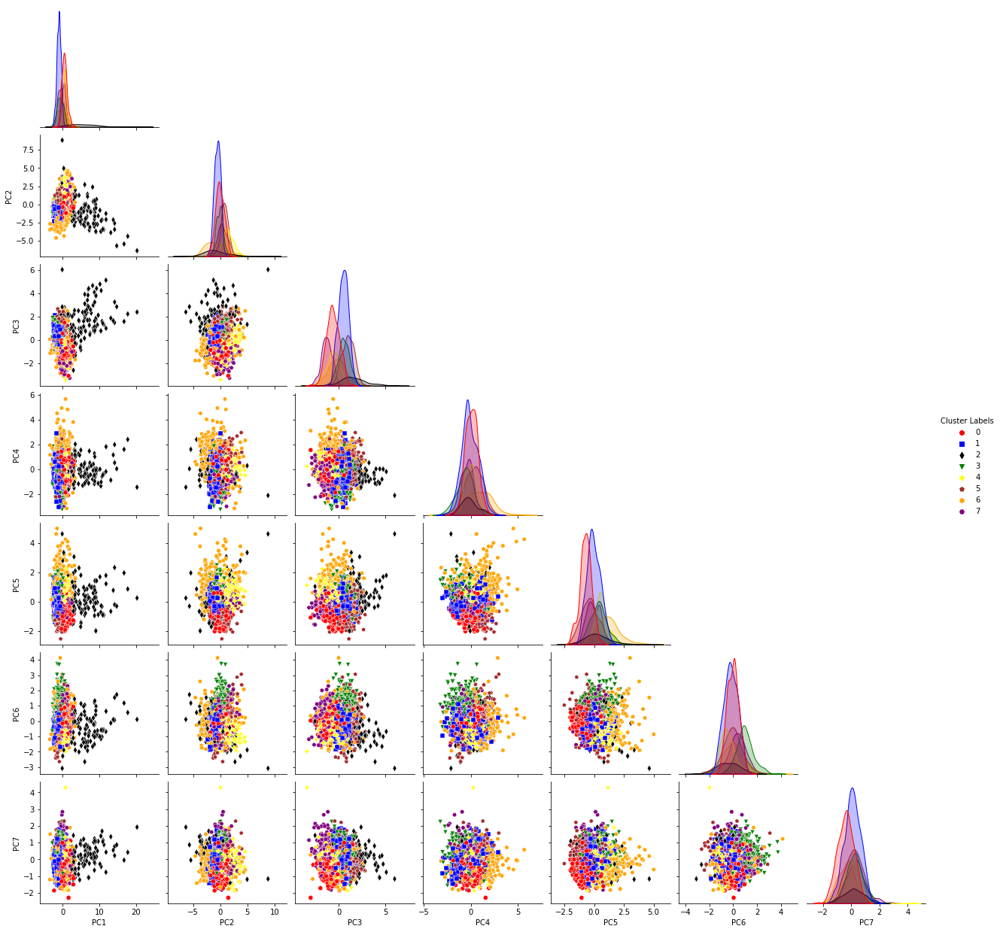

In [53]:
import seaborn as sns

sns.pairplot(df_pca_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H'], corner = True)

In [ ]:
df_pca_reduced_gmm_viz_org = df_X_train_transformed.copy()
df_pca_reduced_gmm_viz_org['Cluster Labels'] = cluster_labels_pca_optimal_gmm

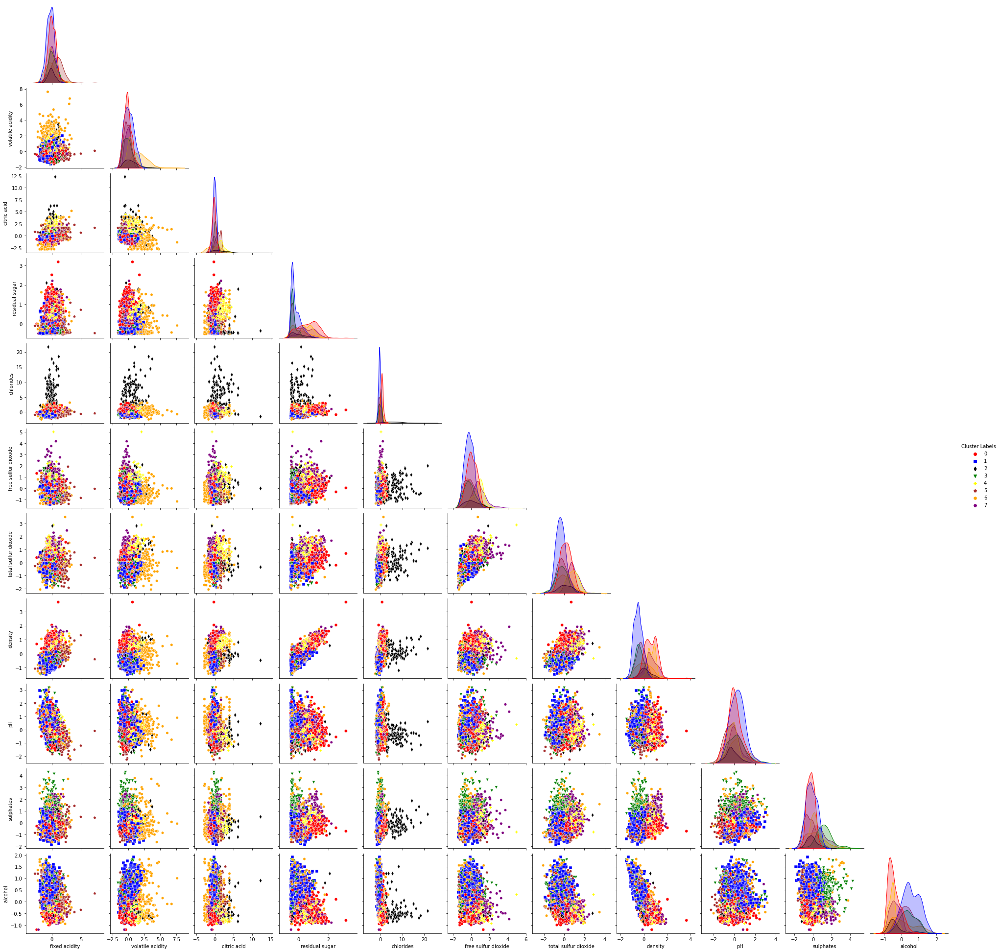

In [ ]:
sns.pairplot(df_pca_reduced_gmm_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H'], corner = True)

In [64]:
# Adding Cluster labels to features for NN

df_pca_reduced_nn = df_pca_reduced.copy()
df_pca_reduced_nn['Cluster Labels'] = cluster_labels_pca_optimal_gmm

In [59]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer

cat_var = ['Cluster Label']
cat_pipeline = Pipeline(steps=[('one_hot', OneHotEncoder())])


full_preprocessor = ColumnTransformer(transformers=[('Categorical_onhot', cat_pipeline, cat_var)],remainder ='passthrough')

In [60]:
X_train_oneHot_pca = full_preprocessor.fit_transform(df_pca_reduced_nn)

In [65]:
## NN Model For PCA 
X_train_pca_cl, X_val_pca_cl, y_train_pca, y_val_pca_cl = train_test_split(X_train_oneHot_pca, y_train, test_size=0.15, stratify= y_train)

In [66]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_pca)
y_val_tra = le.transform(y_val_pca)
y_test_tra = le.transform(y_test)

In [67]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

In [71]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [72]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [118]:
#Hyperparameters
input_size = X_train_pca_cl.shape[1]
num_classes = 7
hidden_layer = 128
learning_rate = 0.005
batch_size = 45
num_epochs = 80
regularization_rate = 0.0001

In [76]:
df_pca_reduced_X_test = pd.DataFrame(pca_reduced_X_test, columns= ['PC1', 'PC2', 'PC3', 'PC4',
                                                      'PC5', 'PC6', 'PC7'])

In [78]:
cluster_labels_X_test_pca_cl = gmm_optimal_pca.predict(df_pca_reduced_X_test)

In [80]:
pca_reduced_X_test_nn = df_pca_reduced_X_test.copy()
pca_reduced_X_test_nn['Cluster Labels'] = cluster_labels_X_test_pca_cl
X_test_oneHot_pca = full_preprocessor.transform(pca_reduced_X_test_nn)

In [82]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_pca_cl)
X_val_tensor = torch.tensor(X_val_pca_cl)
X_test_tensor = torch.tensor(X_test_oneHot_pca)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [83]:
train_data_pca = TensorDataset(X_train_tensor, y_train_tensor)
val_data_pca = TensorDataset(X_val_tensor, y_val_tensor)
test_data_pca = TensorDataset(X_test_tensor, y_test_tensor) 

In [84]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_pca, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_pca, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_pca, batch_size = batch_size)

In [105]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [106]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [119]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Streaming output truncated to the last 5000 lines.
Batch # 0 Loss: 1.17
Batch # 1 Loss: 1.09
Batch # 2 Loss: 1.22
Batch # 3 Loss: 1.11
Batch # 4 Loss: 1.05
Batch # 5 Loss: 1.21
Batch # 6 Loss: 1.35
Batch # 7 Loss: 1.39
Batch # 8 Loss: 1.11
Batch # 9 Loss: 1.33
Batch # 10 Loss: 1.31
Batch # 11 Loss: 1.16
Batch # 12 Loss: 1.14
Batch # 13 Loss: 1.47
Batch # 14 Loss: 1.25
Batch # 15 Loss: 1.13
Batch # 16 Loss: 1.22
Batch # 17 Loss: 1.19
Batch # 18 Loss: 1.03
Batch # 19 Loss: 1.17
Batch # 20 Loss: 1.29
Batch # 21 Loss: 1.23
Batch # 22 Loss: 1.48
Batch # 23 Loss: 0.97
Batch # 24 Loss: 1.28
Batch # 25 Loss: 1.13
Batch # 26 Loss: 1.25
Batch # 27 Loss: 1.20
Batch # 28 Loss: 1.40
Batch # 29 Loss: 1.11
Batch # 30 Loss: 1.22
Batch # 31 Loss: 1.18
Batch # 32 Loss: 1.25
Batch # 33 Loss: 1.46
Batch # 34 Loss: 1.40
Batch # 35 Loss: 1.15
Batch # 36 Loss: 1.31
Batch # 37 Loss: 1.47
Batch # 38 Loss: 1.13
Batch # 39 Loss: 1.21
Batch # 40 Loss: 1.25
Batch # 41 Loss: 1.24
Batch # 42 Loss: 1.19
Batch # 43 Lo

In [120]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

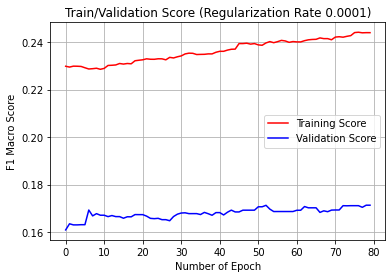

In [121]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [122]:
check_classification_report(test_data_load, model)

Got 461 / 1225 with accuracy of 37.63
Average Precision Score: 0.67
Average recall Score: 0.67
Average f1-Score: 0.18


In [123]:
check_classification_report(train_data_load, model)

Got 1514 / 3122 with accuracy of 48.49
Average Precision Score: 0.74
Average recall Score: 0.74
Average f1-Score: 0.24


**Independent Component Analysis**

In [124]:
#Calculating Mutual Information between components
from sklearn.feature_selection import mutual_info_regression

def custom_mi_reg(a, b):
    a = a.reshape(-1, 1)
    return  mutual_info_regression(a, b, random_state=0)[0] # should return a float value

In [125]:
ica_col = [str(i) for i in range(1, df_X_train_transformed.shape[1] + 1)]

In [126]:
ica_col

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11']

In [506]:
from sklearn.decomposition import FastICA

training_time_ica = []
kurtosis_list = []
mi_list = [1]
for i in range(1, df_X_train_transformed.shape[1] + 1):
  ica = FastICA(n_components= i, random_state= 0)
  t_0_ica = time()
  ica.fit(df_X_train_transformed)
  training_time_ica.append(time() - t_0_ica)
  X_ica_transformed = ica.transform(df_X_train_transformed)

  df_X_ica_transformed = pd.DataFrame(X_ica_transformed, columns = ica_col[:i])
  #Storing Kurtosis and Mutual information
  if i >= 2:
    df_mi = df_X_ica_transformed.corr(method=custom_mi_reg)
    mu_matrix = df_mi.to_numpy()
    sum_mu = np.tril(mu_matrix).sum() - np.trace(mu_matrix)
    mi_list.append(sum_mu)
  
  
  kur_tranformed = abs(df_X_ica_transformed.kurtosis(axis=0)).mean()
  kurtosis_list.append(kur_tranformed)


Text(0, 0.5, 'Sum of Mutual Information between the components')

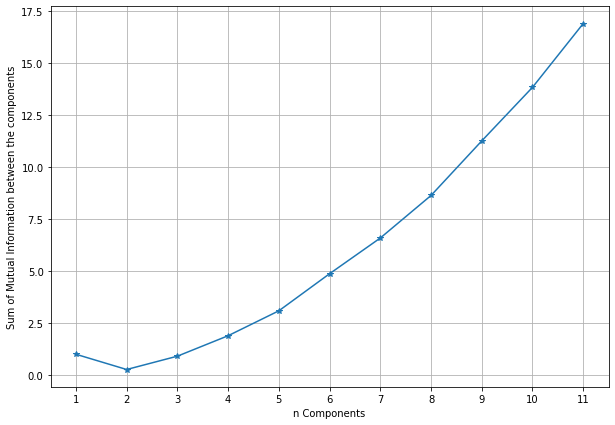

In [128]:
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, df_X_ica_transformed.shape[1] + 1), mi_list, marker='*')
plt.xlabel('n Components')
plt.xticks(range(1, df_X_ica_transformed.shape[1] + 1))
plt.ylabel('Sum of Mutual Information between the components')

Text(0, 0.5, 'Mean of Kurtosis')

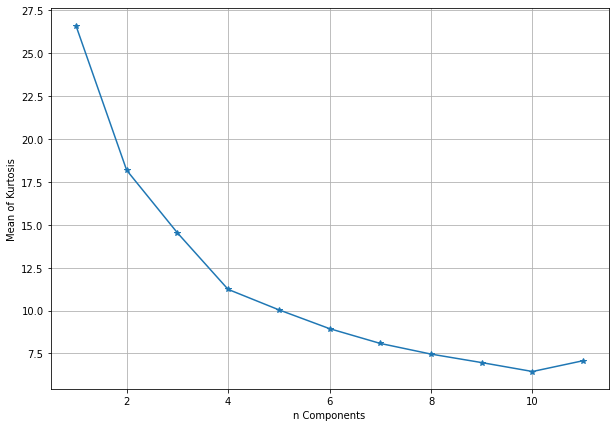

In [129]:
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, df_X_ica_transformed.shape[1] + 1), kurtosis_list, marker='*')
plt.xlabel('n Components')
plt.ylabel('Mean of Kurtosis')

In [130]:
# n=2 has the minimum Mutual value

ica_optimal = FastICA(n_components=2, random_state=0,max_iter = 20000)
ica_X_optimal = ica_optimal.fit_transform(df_X_train_transformed)

In [131]:
df_ica_X_optimal = pd.DataFrame(ica_X_optimal, columns=['IC1', 'IC2'])

In [132]:
df_ica_X_optimal.corr()

,IC1,IC2
IC1,1.000000e+00,-3.743208e-16
IC2,-3.743208e-16,1.000000e+00


**NN with ICAs Components**

In [203]:
## NN Model For ICA 
X_train_ica, X_val_ica, y_train_ica, y_val_ica = train_test_split(df_ica_X_optimal, y_train, test_size=0.15, stratify= y_train)

In [204]:
print(y_train_ica.value_counts())
print(y_val_ica.value_counts())
print(y_test.value_counts())

6    1401
5     929
7     561
8     111
4     104
3      13
9       3
Name: quality, dtype: int64
6    247
5    164
7     99
8     20
4     18
3      2
9      1
Name: quality, dtype: int64
6    550
5    364
7    220
8     44
4     41
3      5
9      1
Name: quality, dtype: int64


In [205]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_ica)
y_val_tra = le.transform(y_val_ica)
y_test_tra = le.transform(y_test)

In [206]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f57162fd0d0>,
      dtype=object)

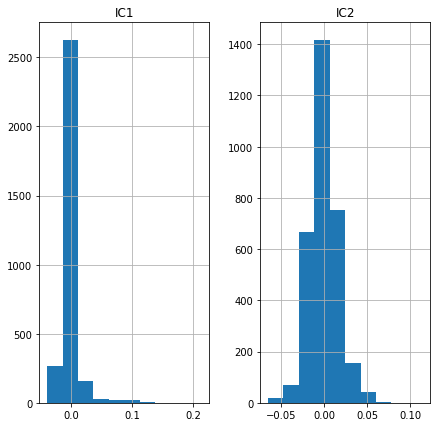

In [207]:
X_train_ica.hist(figsize=(7,7))

In [208]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score
from sklearn.utils import resample
import numpy as np

In [230]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [224]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [245]:
#Hyperparameters
input_size = X_train_ica.shape[1]
num_classes = 7
hidden_layer = 32
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [212]:
# Transforming X_test to new dimensions
ica_X_test_optimal = ica_optimal.transform(df_X_test_transformed)

In [213]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_ica.values)
X_val_tensor = torch.tensor(X_val_ica.values)
X_test_tensor = torch.tensor(ica_X_test_optimal)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [214]:
train_data_ica = TensorDataset(X_train_tensor, y_train_tensor)
val_data_ica = TensorDataset(X_val_tensor, y_val_tensor)
test_data_ica = TensorDataset(X_test_tensor, y_test_tensor) 

In [215]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_ica, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_ica, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_ica, batch_size = batch_size)

In [246]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [247]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [248]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 1.96
Batch # 1 Loss: 1.92
Batch # 2 Loss: 1.91
Batch # 3 Loss: 1.91
Batch # 4 Loss: 1.81
Batch # 5 Loss: 1.96
Batch # 6 Loss: 1.82
Batch # 7 Loss: 1.86
Batch # 8 Loss: 1.91
Batch # 9 Loss: 1.87
Batch # 10 Loss: 1.85
Batch # 11 Loss: 1.93
Batch # 12 Loss: 1.82
Batch # 13 Loss: 1.81
Batch # 14 Loss: 1.89
Batch # 15 Loss: 1.87
Batch # 16 Loss: 1.75
Batch # 17 Loss: 1.87
Batch # 18 Loss: 1.90
Batch # 19 Loss: 1.83
Batch # 20 Loss: 1.81
Batch # 21 Loss: 1.76
Batch # 22 Loss: 1.77
Batch # 23 Loss: 1.74
Batch # 24 Loss: 1.89
Batch # 25 Loss: 1.76
Batch # 26 Loss: 1.80
Batch # 27 Loss: 1.68
Batch # 28 Loss: 1.73
Batch # 29 Loss: 1.68
Batch # 30 Loss: 1.82
Batch # 31 Loss: 1.74
Batch # 32 Loss: 1.70
Batch # 33 Loss: 1.73
Batch # 34 Loss: 1.64
Batch # 35 Loss: 1.73
Batch # 36 Loss: 1.71
Batch # 37 Loss: 1.69
Batch # 38 Loss: 1.68
Batch # 39 Loss: 1.55
Batch # 40 Loss: 1.61
Batch # 41 Loss: 1.66
Batch # 42 Loss: 1.63
Batch # 43 Loss: 1.65
Batch # 44 Loss: 1.74
Batch # 45 Loss: 1.6

In [249]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

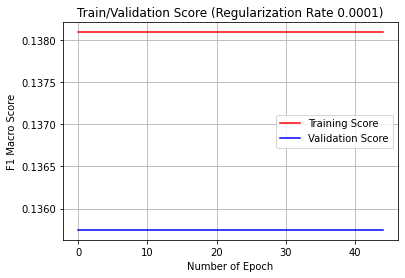

In [250]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [251]:
check_classification_report(test_data_load, model)

Got 550 / 1225 with accuracy of 44.90
Average Precision Score: 0.88
Average recall Score: 0.88
Average f1-Score: 0.13


In [252]:
check_classification_report(train_data_load, model)

Got 1401 / 3122 with accuracy of 44.88
Average Precision Score: 0.88
Average recall Score: 0.88
Average f1-Score: 0.14


For 2 number of clusters, the average Silhouette score is 0.7317321207118648
For 3 number of clusters, the average Silhouette score is 0.40832295501005234
For 4 number of clusters, the average Silhouette score is 0.3324416297953218
For 5 number of clusters, the average Silhouette score is 0.34417734770275893
For 6 number of clusters, the average Silhouette score is 0.3454908211028709
For 7 number of clusters, the average Silhouette score is 0.3445926451409942
For 8 number of clusters, the average Silhouette score is 0.34666758294559125
For 9 number of clusters, the average Silhouette score is 0.35197241021681575
For 10 number of clusters, the average Silhouette score is 0.3418018896744474
For 11 number of clusters, the average Silhouette score is 0.34240129107538714
For 12 number of clusters, the average Silhouette score is 0.34181551701616786
For 13 number of clusters, the average Silhouette score is 0.33691769902924207
For 14 number of clusters, the average Silhouette score is 0.3328

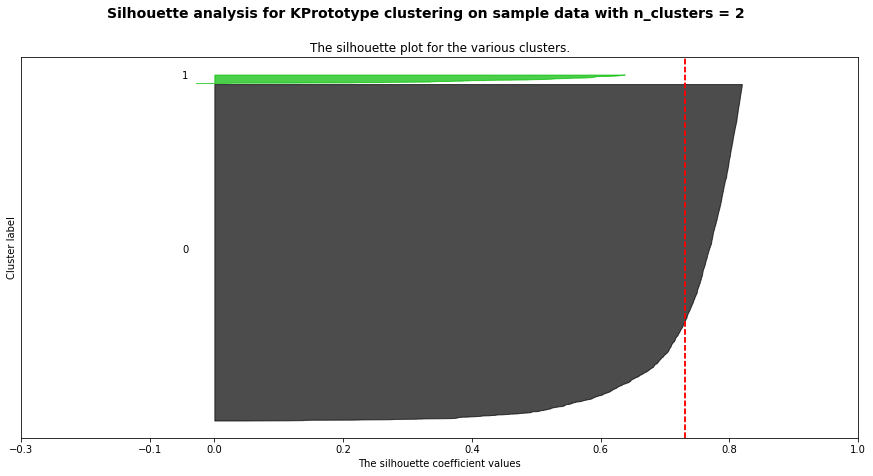

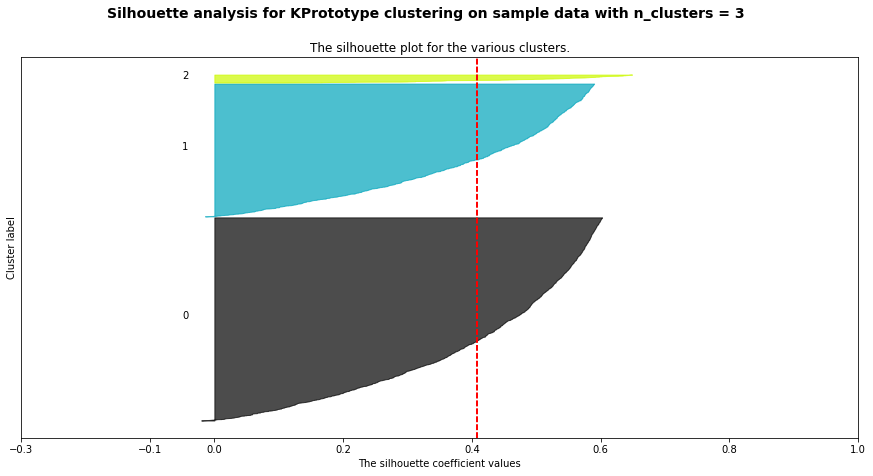

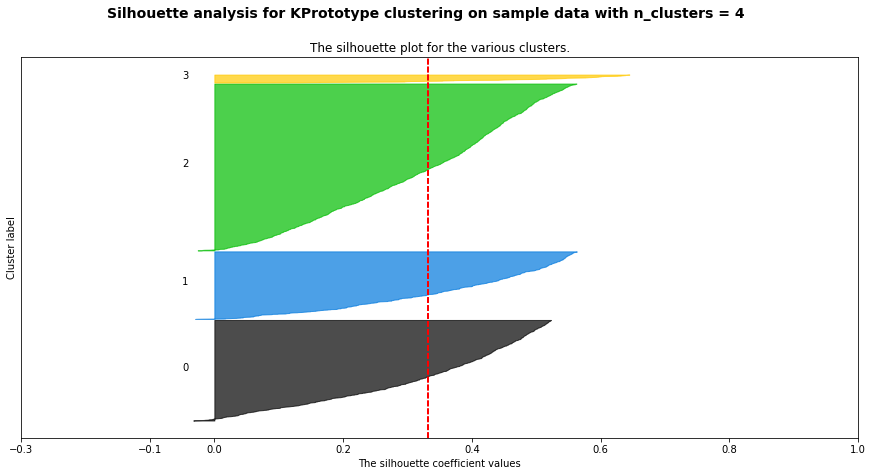

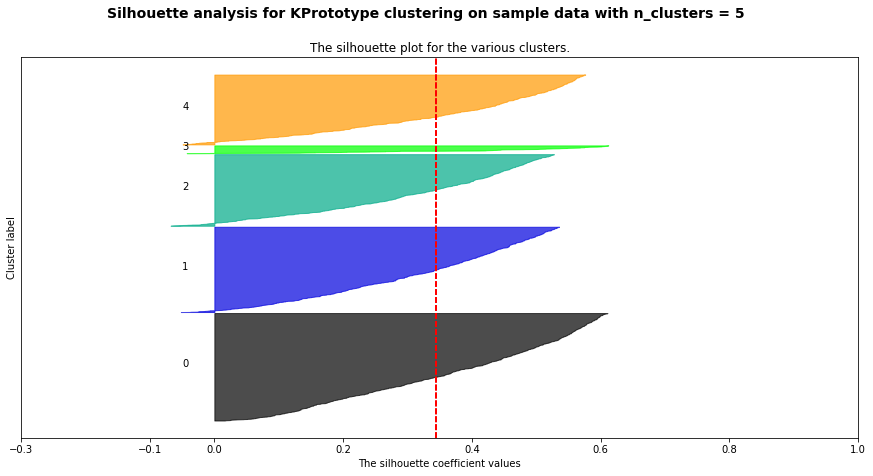

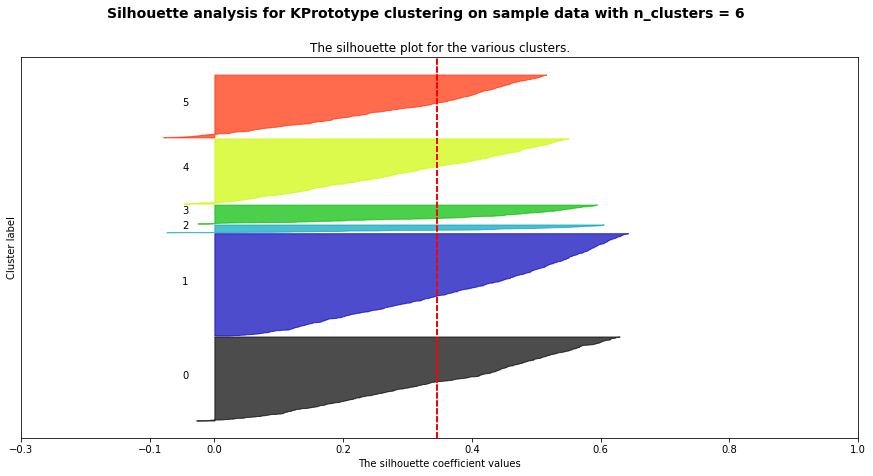

...

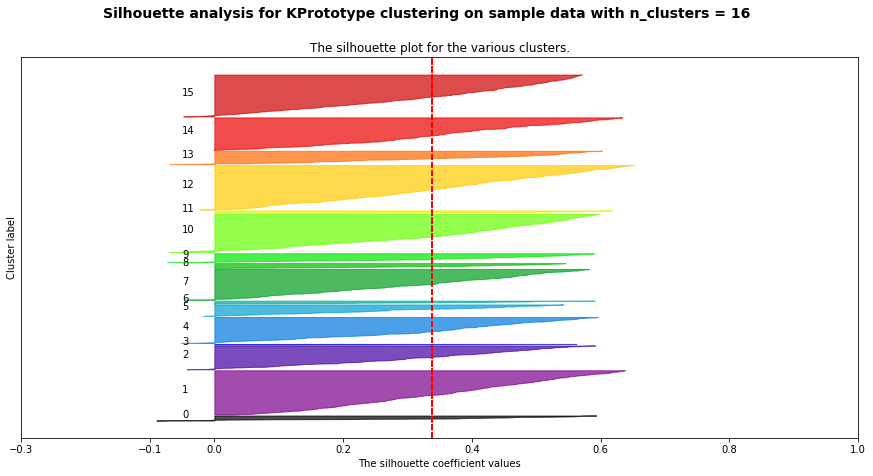

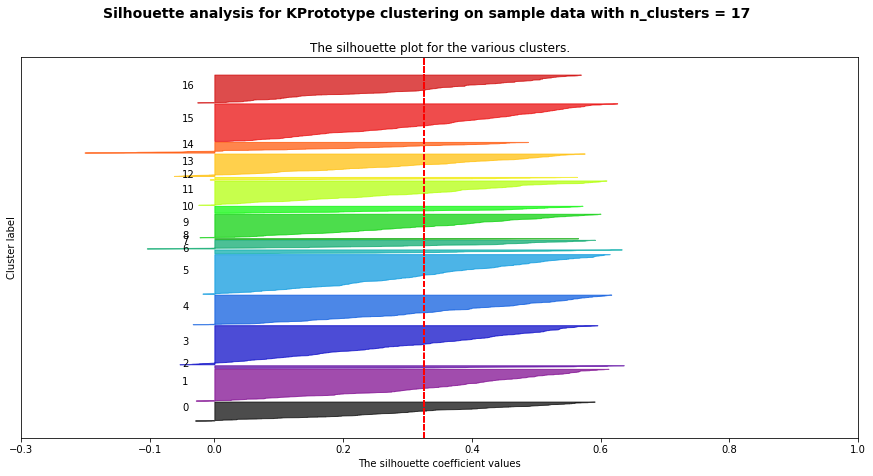

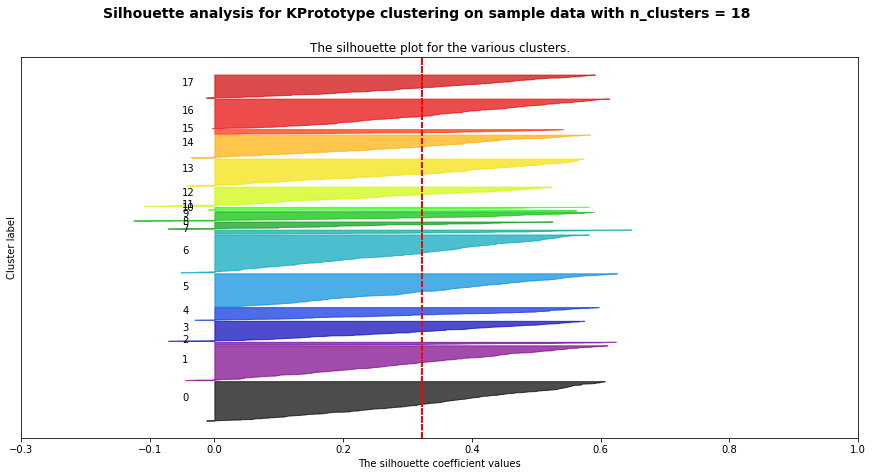

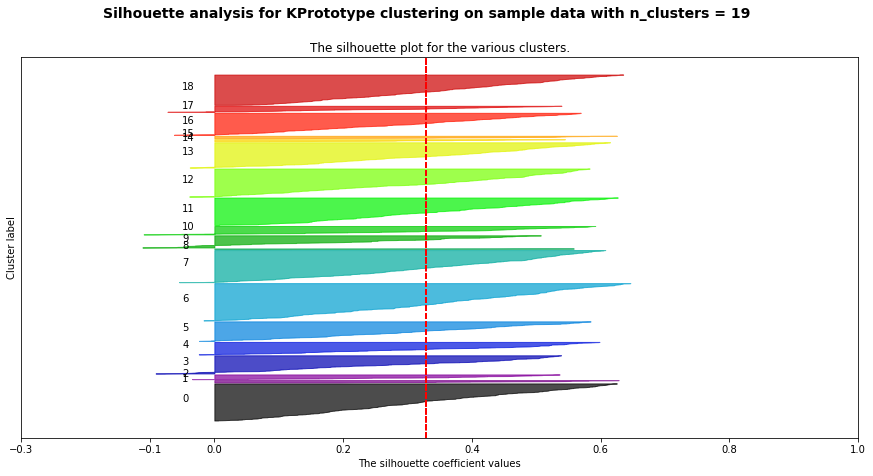

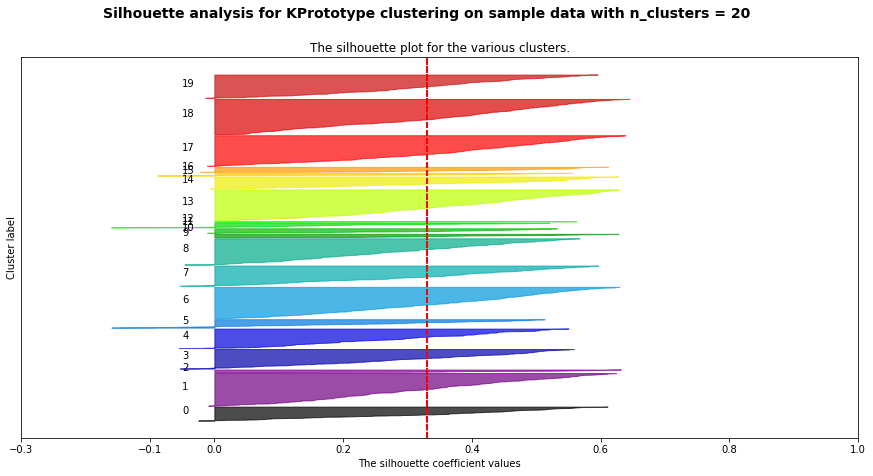

In [284]:
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_ica = []
silhouette_avg_list_ica = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans_ica = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_ica = kmeans_ica.fit_predict(df_ica_X_optimal)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed 
    #clusters

    silhouette_avg_ica = silhouette_score(df_ica_X_optimal, cluster_labels_ica)
    silhouette_avg_list_ica.append(silhouette_avg_ica)
    elbow_lost_ica.append(kmeans_ica.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_ica}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_ica = silhouette_samples(df_ica_X_optimal, cluster_labels_ica)
    
    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_ica = \
            sample_silhouette_values_ica[cluster_labels_ica == i]

      ith_cluster_silhouette_values_ica.sort()

      size_cluster_i = ith_cluster_silhouette_values_ica.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_ica,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_ica, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4) 
      
      
plt.show()

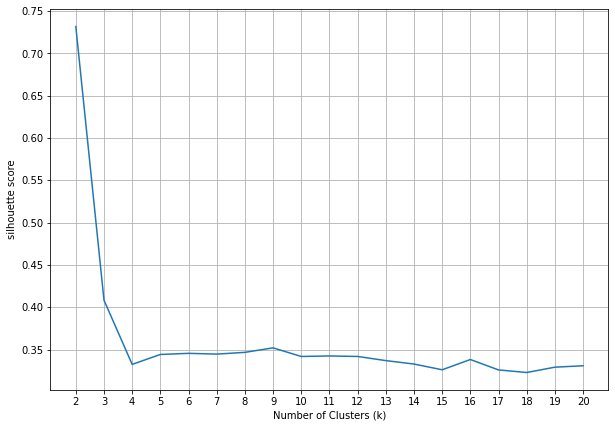

In [285]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), silhouette_avg_list_ica)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.xticks(range(2,21))
plt.show()

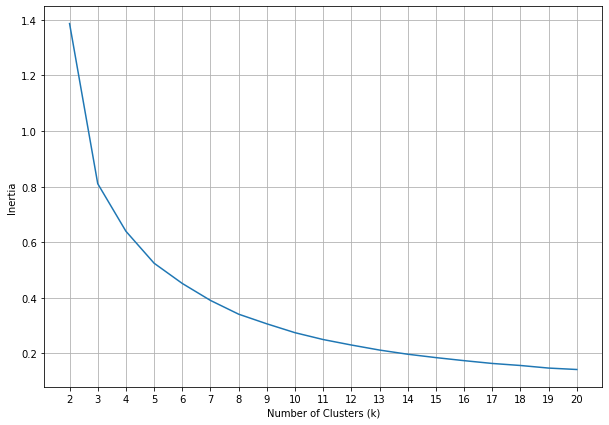

In [286]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), elbow_lost_ica)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [287]:
# K=3 based on silhouette score

kmeans_optimal_ica = KMeans(n_clusters= 3, random_state= 0)
kmeans_optimal_ica.fit(df_ica_X_optimal)
cluster_labels_ica_optimal = kmeans_optimal_ica.predict(df_ica_X_optimal)

In [288]:
df_ica_X_optimal_viz = df_ica_X_optimal.copy()
df_ica_X_optimal_viz['Cluster Labels'] = cluster_labels_ica_optimal

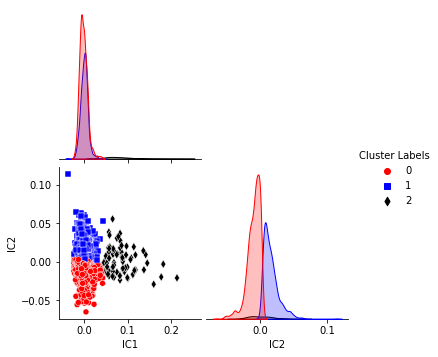

In [289]:
import seaborn as sns

sns.pairplot(df_ica_X_optimal_viz, hue = 'Cluster Labels', palette= ['r', 'blue', 'black'], markers=['o', 's', 'd'], corner = True)

In [290]:
df_ica_X_optimal_viz_org = df_X_train_transformed.copy()
df_ica_X_optimal_viz_org['Cluster Labels'] = cluster_labels_ica_optimal

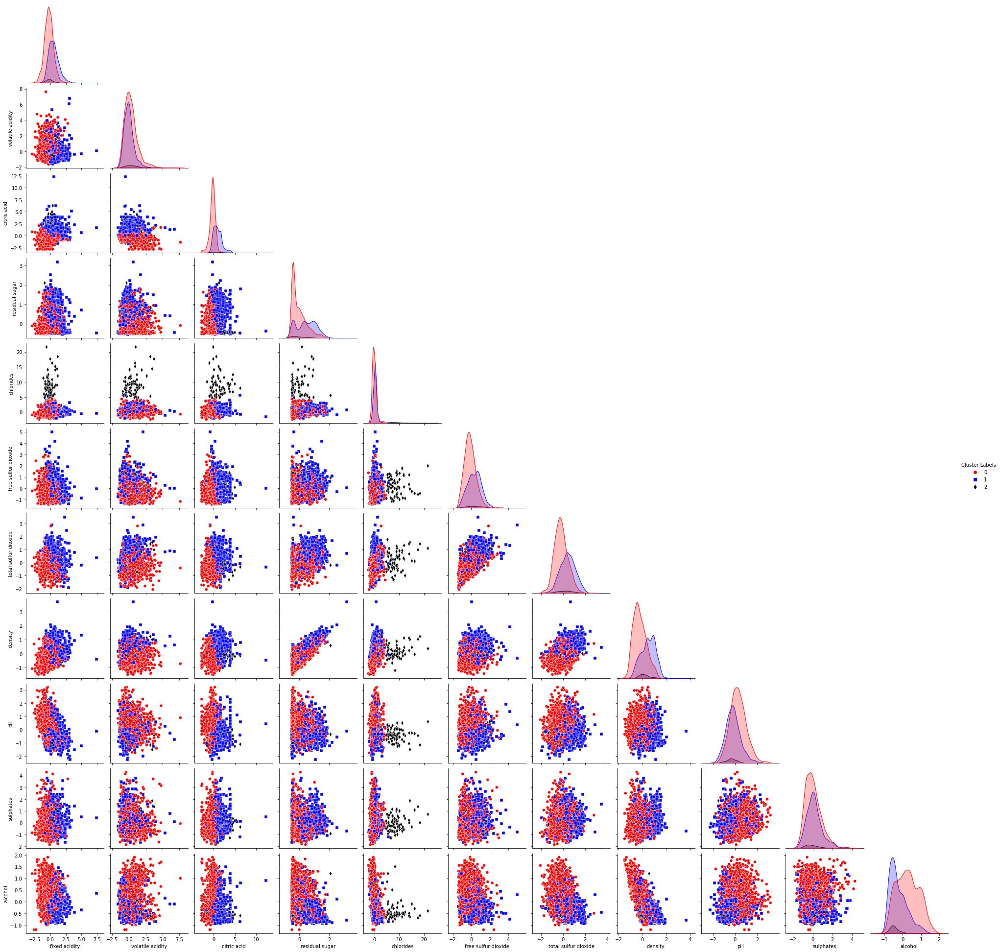

In [261]:
sns.pairplot(df_ica_X_optimal_viz_org, hue = 'Cluster Labels', palette= ['r', 'blue', 'black'], markers=['o', 's', 'd'], corner = True)

Adding ICA Perdicted Cluster Labels for NN 

In [291]:
# Adding ICA Cluster labels to features for NN

df_ica_reduced_nn = df_ica_X_optimal.copy()
df_ica_reduced_nn['Cluster Labels'] = cluster_labels_ica_optimal

In [292]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer

cat_var = ['Cluster Labels']
cat_pipeline = Pipeline(steps=[('one_hot', OneHotEncoder())])


full_preprocessor = ColumnTransformer(transformers=[('Categorical_onhot', cat_pipeline, cat_var)],remainder ='passthrough')

In [293]:
X_train_oneHot_ica = full_preprocessor.fit_transform(df_ica_reduced_nn)

In [294]:
## NN Model For PCA 
X_train_ica_cl, X_val_ica_cl, y_train_ica, y_val_ica_cl = train_test_split(X_train_oneHot_ica, y_train, test_size=0.15, stratify= y_train)

In [295]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_ica)
y_val_tra = le.transform(y_val_ica)
y_test_tra = le.transform(y_test)

In [296]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

In [297]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [298]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [322]:
#Hyperparameters
input_size = X_train_ica_cl.shape[1]
num_classes = 7
hidden_layer = 64
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [300]:
ica_X_test_optimal = ica_optimal.transform(df_X_test_transformed)

In [301]:
df_ica_reduced_X_test = pd.DataFrame(ica_X_test_optimal, columns= ['IC1', 'IC2'])

In [302]:
cluster_labels_X_test_ica_cl = kmeans_optimal_ica.predict(df_ica_reduced_X_test)

In [305]:
ica_reduced_X_test_nn = df_ica_reduced_X_test.copy()
ica_reduced_X_test_nn['Cluster Labels'] = cluster_labels_X_test_ica_cl
X_test_oneHot_ica = full_preprocessor.transform(ica_reduced_X_test_nn)

In [306]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_ica_cl)
X_val_tensor = torch.tensor(X_val_ica_cl)
X_test_tensor = torch.tensor(X_test_oneHot_ica)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [309]:
train_data_ica = TensorDataset(X_train_tensor, y_train_tensor)
val_data_ica = TensorDataset(X_val_tensor, y_val_tensor)
test_data_ica = TensorDataset(X_test_tensor, y_test_tensor) 

In [310]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_ica, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_ica, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_ica, batch_size = batch_size)

In [323]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [325]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [326]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 2.03
Batch # 1 Loss: 1.81
Batch # 2 Loss: 1.74
Batch # 3 Loss: 1.56
Batch # 4 Loss: 1.53
Batch # 5 Loss: 1.40
Batch # 6 Loss: 1.54
Batch # 7 Loss: 1.28
Batch # 8 Loss: 1.18
Batch # 9 Loss: 1.36
Batch # 10 Loss: 1.36
Batch # 11 Loss: 1.20
Batch # 12 Loss: 1.34
Batch # 13 Loss: 1.34
Batch # 14 Loss: 1.40
Batch # 15 Loss: 1.51
Batch # 16 Loss: 1.23
Batch # 17 Loss: 1.09
Batch # 18 Loss: 1.26
Batch # 19 Loss: 1.35
Batch # 20 Loss: 1.53
Batch # 21 Loss: 1.28
Batch # 22 Loss: 1.21
Batch # 23 Loss: 1.03
Batch # 24 Loss: 1.13
Batch # 25 Loss: 1.30
Batch # 26 Loss: 1.43
Batch # 27 Loss: 1.36
Batch # 28 Loss: 1.43
Batch # 29 Loss: 1.16
Batch # 30 Loss: 1.38
Batch # 31 Loss: 1.34
Batch # 32 Loss: 1.42
Batch # 33 Loss: 1.27
Batch # 34 Loss: 1.41
Batch # 35 Loss: 1.19
Batch # 36 Loss: 1.31
Batch # 37 Loss: 1.48
Batch # 38 Loss: 1.48
Batch # 39 Loss: 1.17
Batch # 40 Loss: 1.23
Batch # 41 Loss: 1.37
Batch # 42 Loss: 1.06
Batch # 43 Loss: 1.23
Batch # 44 Loss: 1.02
Batch # 45 Loss: 1.2

In [318]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

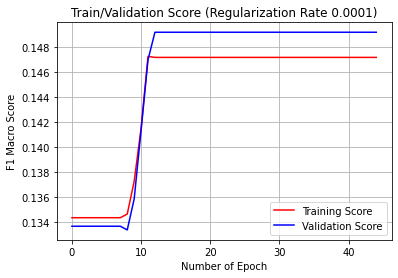

In [319]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [320]:
check_classification_report(test_data_load, model)

Got 548 / 1225 with accuracy of 44.73
Average Precision Score: 0.81
Average recall Score: 0.81
Average f1-Score: 0.13


In [321]:
check_classification_report(train_data_load, model)

Got 1411 / 3122 with accuracy of 45.20
Average Precision Score: 0.82
Average recall Score: 0.82
Average f1-Score: 0.15


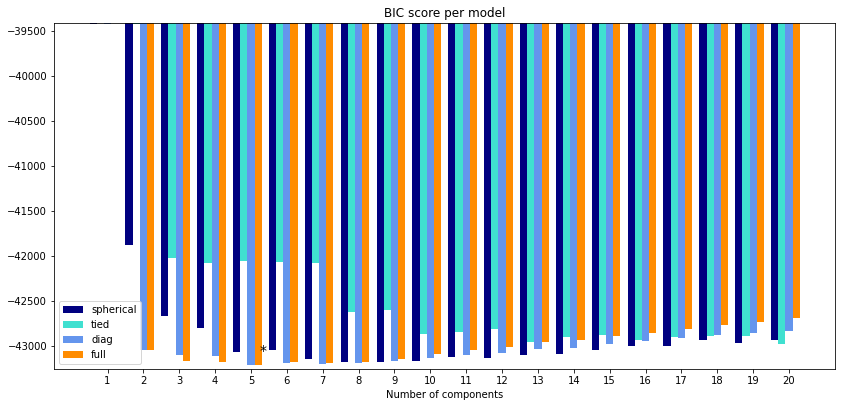

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_ica = np.infty
bic_ica = []
n_components_range_ica = range(1, 21)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_ica:
        # Fit a Gaussian mixture with EM
        gmm_ica = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_ica.fit(df_ica_X_optimal)
        bic_ica.append(gmm_ica.bic(df_ica_X_optimal))
        if bic_ica[-1] < lowest_bic_ica:
            lowest_bic_ica = bic_ica[-1]
            best_gmm_ica = gmm_ica

bic_ica = np.array(bic_ica)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_ica = best_gmm_ica
bars_ica = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_ica) + 0.2 * (i - 2)
    bars_ica.append(
        plt.bar(
            xpos,
            bic_ica[i * len(n_components_range_ica) : (i + 1) * len(n_components_range_ica)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_ica)
plt.ylim([bic_ica.min() * 1.01 - 0.01 * bic_ica.max(), bic_ica.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_ica.argmin(), len(n_components_range_ica))
    + 0.65
    + 0.2 * np.floor(bic_ica.argmin() / len(n_components_range_ica))
)
plt.text(xpos, bic_ica.min() * 0.97 + 0.03 * bic_ica.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_ica], cv_types)

In [ ]:
# Choosing K=5 and covariance of "FULL" based on BIC score

gmm_optimal_ica = mixture.GaussianMixture(n_components= 5, covariance_type="full", random_state= 0)
gmm_optimal_ica.fit(df_ica_X_optimal)
cluster_labels_ica_optimal_gmm = gmm_optimal_ica.predict(df_ica_X_optimal)

In [ ]:
df_ica_reduced_gmm_viz = df_ica_X_optimal.copy()
df_ica_reduced_gmm_viz['Cluster Labels'] = cluster_labels_ica_optimal_gmm

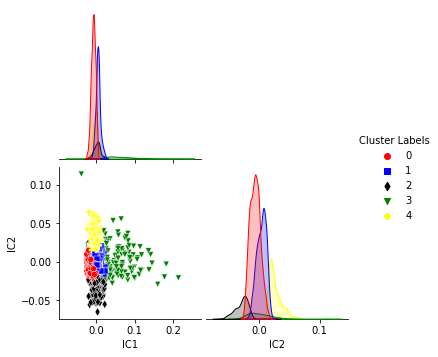

In [ ]:
sns.pairplot(df_ica_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow'], markers=['o', 's', 'd', 'v', 'P'], corner = True)

In [ ]:
df_ica_reduced_gmm_viz_org = df_X_train_transformed.copy()
df_ica_reduced_gmm_viz_org['Cluster Labels'] = cluster_labels_ica_optimal_gmm

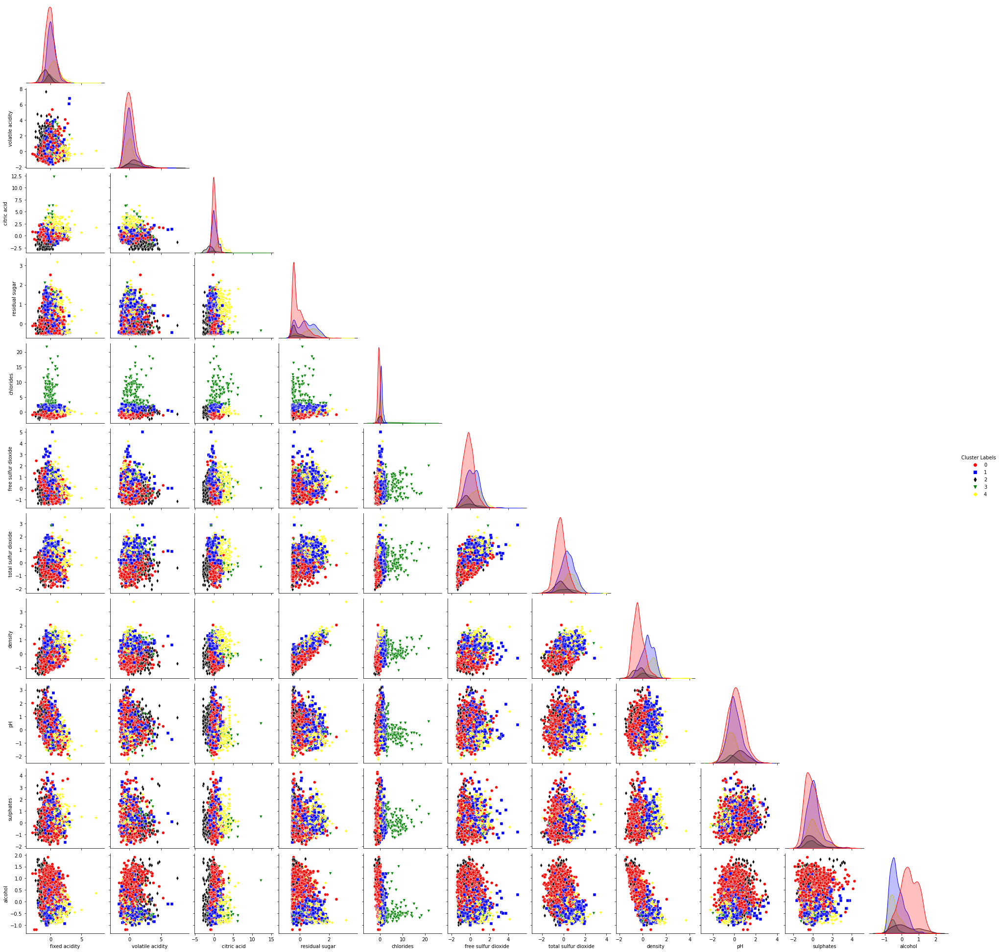

In [ ]:
sns.pairplot(df_ica_reduced_gmm_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow'], markers=['o', 's', 'd', 'v', 'P'], corner = True)

In [507]:
import numpy as np

from sklearn.random_projection import GaussianRandomProjection
training_time_rca = []
A = df_X_train_transformed.to_numpy()

reconstruction_norm = []

for i in range(1, df_X_train_transformed.shape[1] + 1):
  rca = GaussianRandomProjection(n_components = i, random_state = 0)
  t_0_rca = time()
  rca.fit(df_X_train_transformed)
  training_time_rca.append(time() - t_0_rca)
  X_rca_transformed = rca.transform(df_X_train_transformed)

  W = rca.components_
  W_pinv = np.linalg.pinv(W).transpose()
  B = np.dot(X_rca_transformed, W_pinv)

  reconstruction_norm.append(np.linalg.norm(A - B))

Text(0, 0.5, 'Reconstruction Norm')

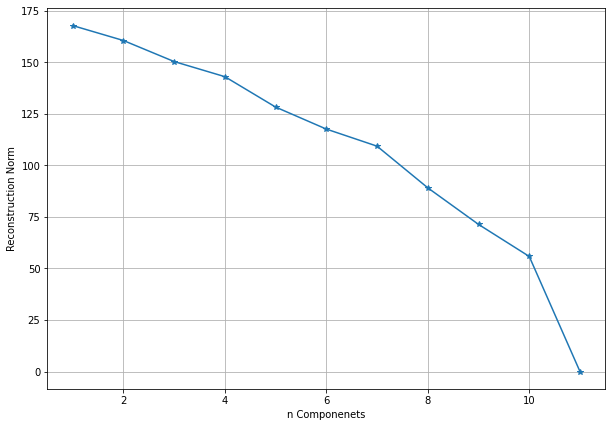

In [329]:
#plotting Reconstruction Error 
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, df_X_train_transformed.shape[1] + 1), reconstruction_norm, marker = '*')
plt.xlabel('n Componenets')
plt.ylabel('Reconstruction Norm')

In [334]:
# n = 8 is decided based on graph

rca_optimal = GaussianRandomProjection(n_components = 8, random_state=0)
rca_optimal.fit(df_X_train_transformed.to_numpy())
X_rca_optimal_transformed = rca_optimal.transform(df_X_train_transformed.to_numpy())

**NN model for RCA dim reduction**

In [336]:
df_X_rca_optimal_transformed = pd.DataFrame(X_rca_optimal_transformed, columns = ['RC1', 'RC2', 'RC3', 'RC4', 'RC5', 'RC6', 'RC7', 'RC8'])

In [337]:
## NN Model For ICA 
X_train_rca, X_val_rca, y_train_rca, y_val_rca = train_test_split(df_X_rca_optimal_transformed, y_train, test_size=0.15, stratify= y_train)

In [338]:
print(y_train_rca.value_counts())
print(y_val_rca.value_counts())
print(y_test.value_counts())

6    1401
5     929
7     561
8     111
4     104
3      13
9       3
Name: quality, dtype: int64
6    247
5    164
7     99
8     20
4     18
3      2
9      1
Name: quality, dtype: int64
6    550
5    364
7    220
8     44
4     41
3      5
9      1
Name: quality, dtype: int64


In [340]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_rca)
y_val_tra = le.transform(y_val_rca)
y_test_tra = le.transform(y_test)

In [341]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f571333ebd0>,
      dtype=object)

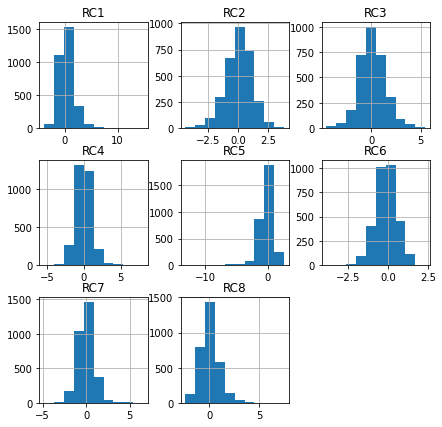

In [342]:
X_train_rca.hist(figsize=(7,7))

In [343]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score
from sklearn.utils import resample
import numpy as np

In [344]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [345]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [346]:
#Hyperparameters
input_size = X_train_rca.shape[1]
num_classes = 7
hidden_layer = 32
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [348]:
# Transforming X_test to new dimensions
rca_X_test_optimal = rca_optimal.transform(X_test_transformed)

In [349]:
rca_X_test_optimal.shape

(1225, 8)

In [350]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_rca.values)
X_val_tensor = torch.tensor(X_val_rca.values)
X_test_tensor = torch.tensor(rca_X_test_optimal)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [351]:
train_data_rca = TensorDataset(X_train_tensor, y_train_tensor)
val_data_rca = TensorDataset(X_val_tensor, y_val_tensor)
test_data_rca = TensorDataset(X_test_tensor, y_test_tensor) 

In [352]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_rca, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_rca, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_rca, batch_size = batch_size)

In [353]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [354]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [356]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 1.83
Batch # 1 Loss: 1.81
Batch # 2 Loss: 1.79
Batch # 3 Loss: 1.78
Batch # 4 Loss: 1.74
Batch # 5 Loss: 1.79
Batch # 6 Loss: 1.78
Batch # 7 Loss: 1.83
Batch # 8 Loss: 1.76
Batch # 9 Loss: 1.77
Batch # 10 Loss: 1.65
Batch # 11 Loss: 1.69
Batch # 12 Loss: 1.72
Batch # 13 Loss: 1.75
Batch # 14 Loss: 1.72
Batch # 15 Loss: 1.80
Batch # 16 Loss: 1.76
Batch # 17 Loss: 1.78
Batch # 18 Loss: 1.67
Batch # 19 Loss: 1.70
Batch # 20 Loss: 1.64
Batch # 21 Loss: 1.74
Batch # 22 Loss: 1.70
Batch # 23 Loss: 1.76
Batch # 24 Loss: 1.72
Batch # 25 Loss: 1.64
Batch # 26 Loss: 1.70
Batch # 27 Loss: 1.77
Batch # 28 Loss: 1.62
Batch # 29 Loss: 1.73
Batch # 30 Loss: 1.62
Batch # 31 Loss: 1.70
Batch # 32 Loss: 1.55
Batch # 33 Loss: 1.58
Batch # 34 Loss: 1.66
Batch # 35 Loss: 1.57
Batch # 36 Loss: 1.56
Batch # 37 Loss: 1.59
Batch # 38 Loss: 1.60
Batch # 39 Loss: 1.57
Batch # 40 Loss: 1.58
Batch # 41 Loss: 1.66
Batch # 42 Loss: 1.53
Batch # 43 Loss: 1.56
Batch # 44 Loss: 1.56
Batch # 45 Loss: 1.5

In [357]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

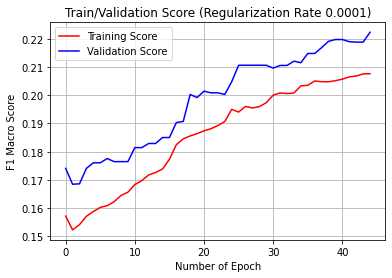

In [358]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [359]:
check_classification_report(test_data_load, model)

Got 567 / 1225 with accuracy of 46.29
Average Precision Score: 0.77
Average recall Score: 0.77
Average f1-Score: 0.20


In [360]:
check_classification_report(train_data_load, model)

Got 1474 / 3122 with accuracy of 47.21
Average Precision Score: 0.77
Average recall Score: 0.77
Average f1-Score: 0.21


For 2 number of clusters, the average Silhouette score is 0.18019065844395082
For 3 number of clusters, the average Silhouette score is 0.16985778183002775
For 4 number of clusters, the average Silhouette score is 0.1405700008841298
For 5 number of clusters, the average Silhouette score is 0.14321181781626863
For 6 number of clusters, the average Silhouette score is 0.1441630534282419
For 7 number of clusters, the average Silhouette score is 0.14280010077369426
For 8 number of clusters, the average Silhouette score is 0.1366902983530554
For 9 number of clusters, the average Silhouette score is 0.12194289079680548
For 10 number of clusters, the average Silhouette score is 0.1349843227103286
For 11 number of clusters, the average Silhouette score is 0.12996796757621
For 12 number of clusters, the average Silhouette score is 0.12812509195762858
For 13 number of clusters, the average Silhouette score is 0.12644382281760566
For 14 number of clusters, the average Silhouette score is 0.126002

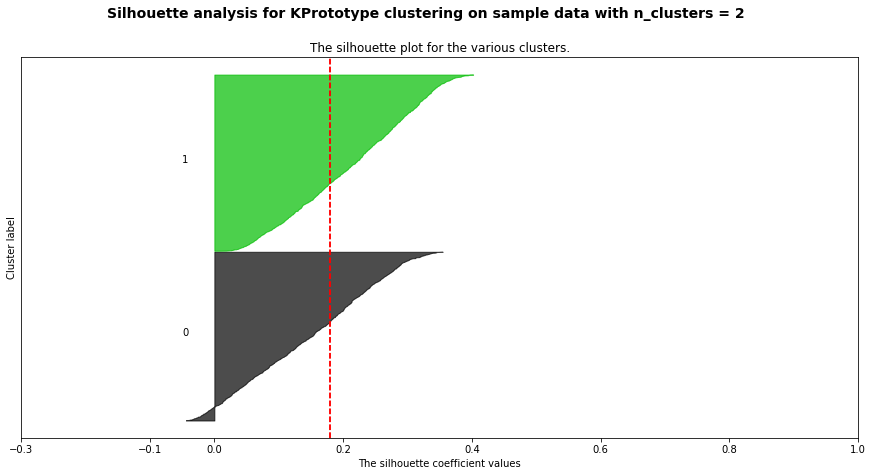

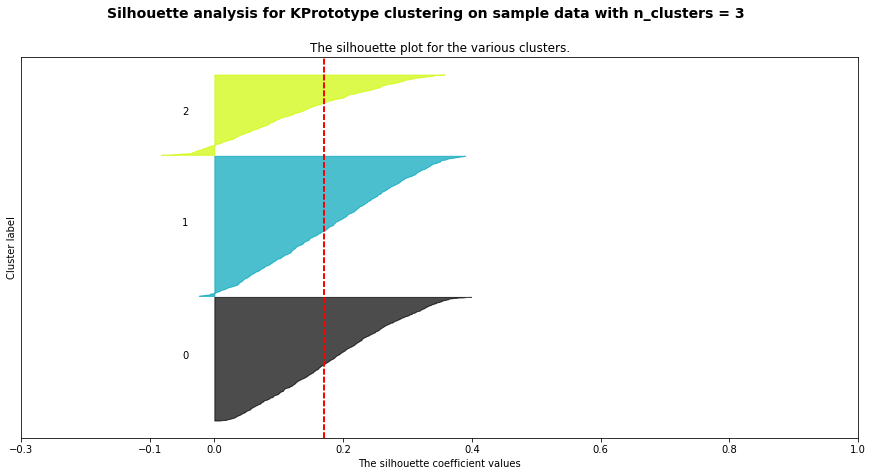

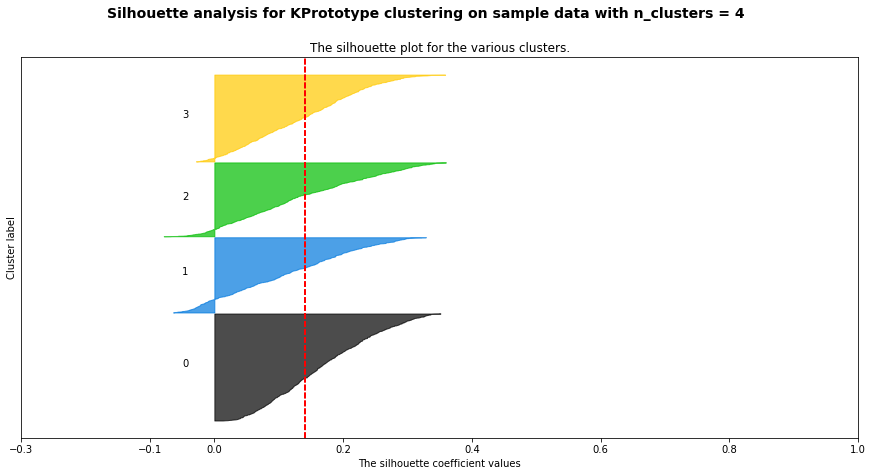

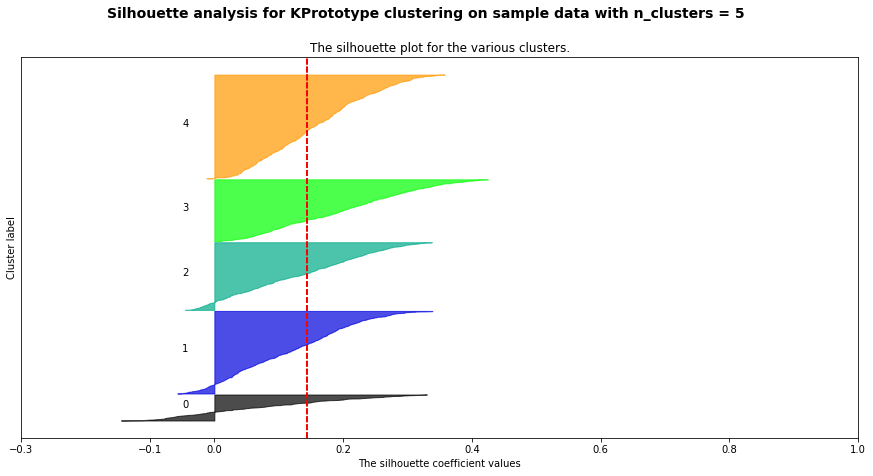

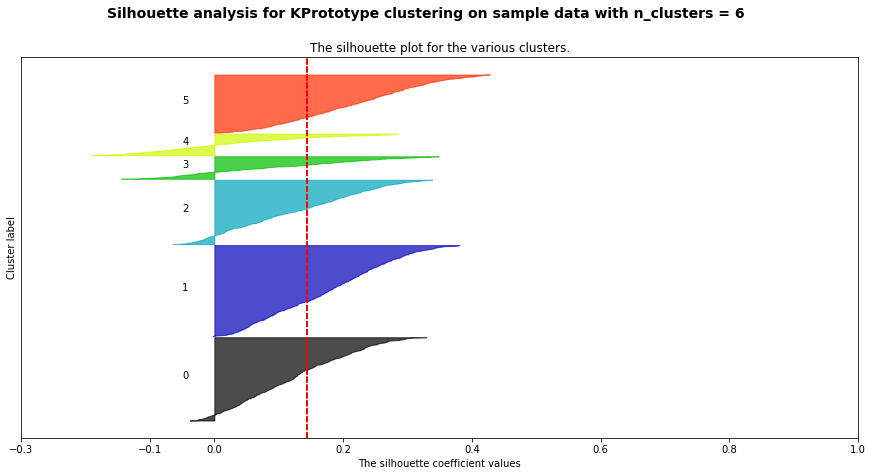

...

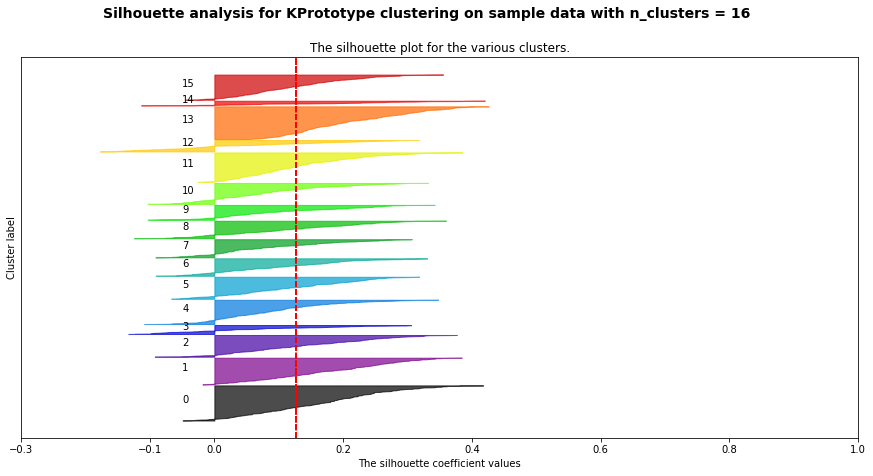

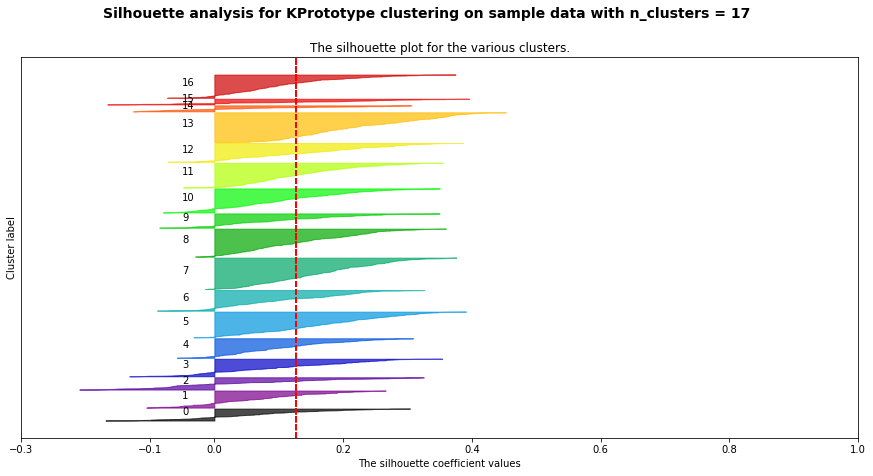

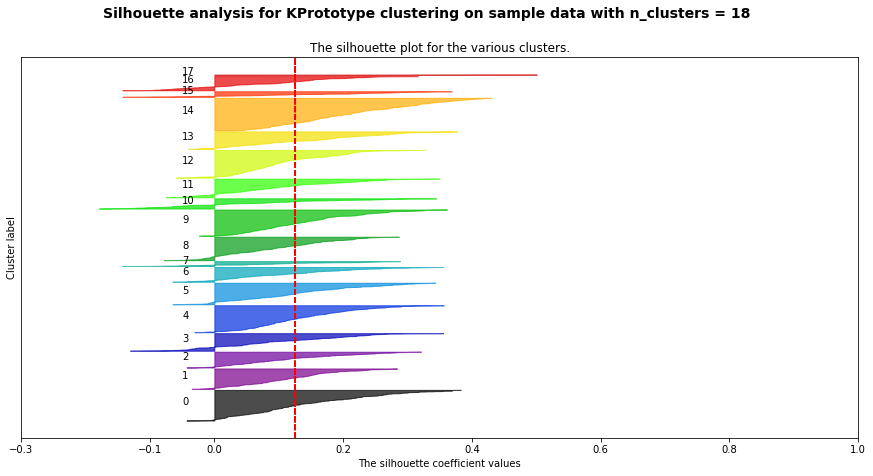

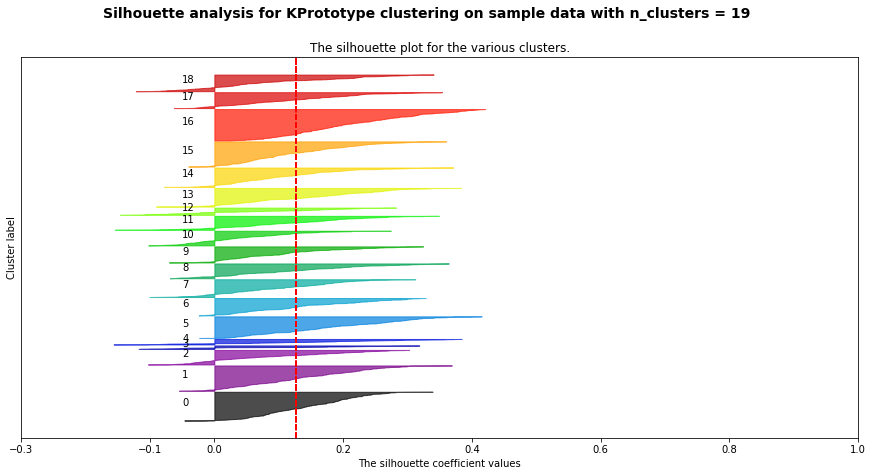

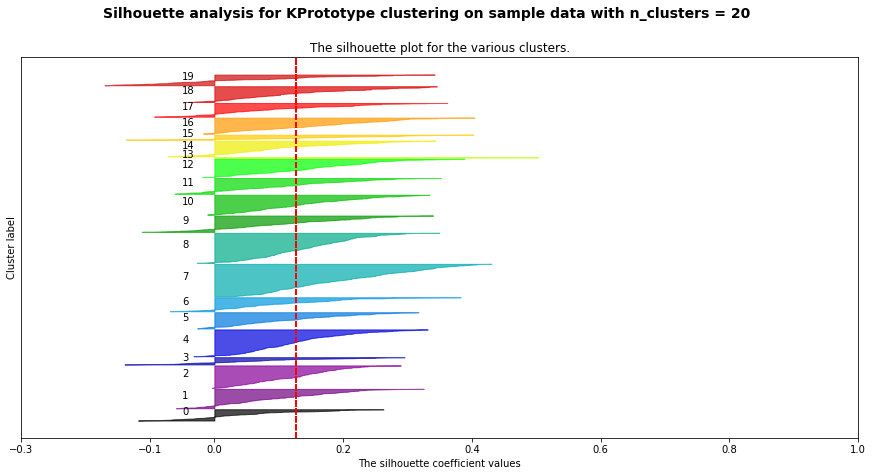

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_rca = []
silhouette_avg_list_rca = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_rca = kmeans.fit_predict(X_rca_optimal_transformed)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed 
    #clusters

    silhouette_avg_rca = silhouette_score(X_rca_optimal_transformed, cluster_labels_rca)
    silhouette_avg_list_rca.append(silhouette_avg_rca)
    elbow_lost_rca.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_rca}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_rca = silhouette_samples(X_rca_optimal_transformed, cluster_labels_rca)
    
    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_rca = \
            sample_silhouette_values_rca[cluster_labels_rca == i]

      ith_cluster_silhouette_values_rca.sort()

      size_cluster_i = ith_cluster_silhouette_values_rca.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_rca,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_rca, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4) 
      
      
plt.show()

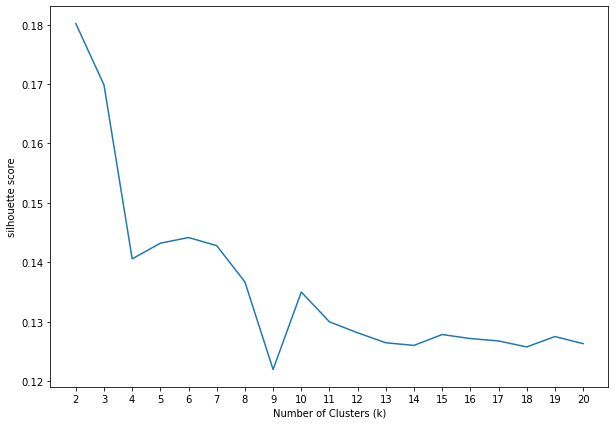

In [ ]:
figure(figsize=(10,7))
plt.plot(range(2,21), silhouette_avg_list_rca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.xticks(range(2,21))
plt.show()

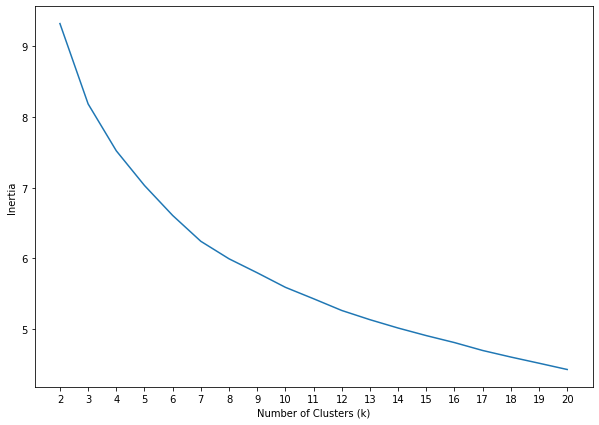

In [ ]:
figure(figsize=(10,7))
plt.plot(range(2,21), elbow_lost_rca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [ ]:
# K=2 based on silhouette score

kmeans_optimal_rca = KMeans(n_clusters= 2, random_state= 0)
kmeans_optimal_rca.fit(X_rca_optimal_transformed)
cluster_labels_rca_optimal = kmeans_optimal_rca.predict(X_rca_optimal_transformed)

In [ ]:
df_rca_X_optimal_viz = df_X_rca_optimal_transformed.copy()
df_rca_X_optimal_viz['Cluster Labels'] = cluster_labels_rca_optimal
df_rca_X_optimal_viz['True Label'] = y_train

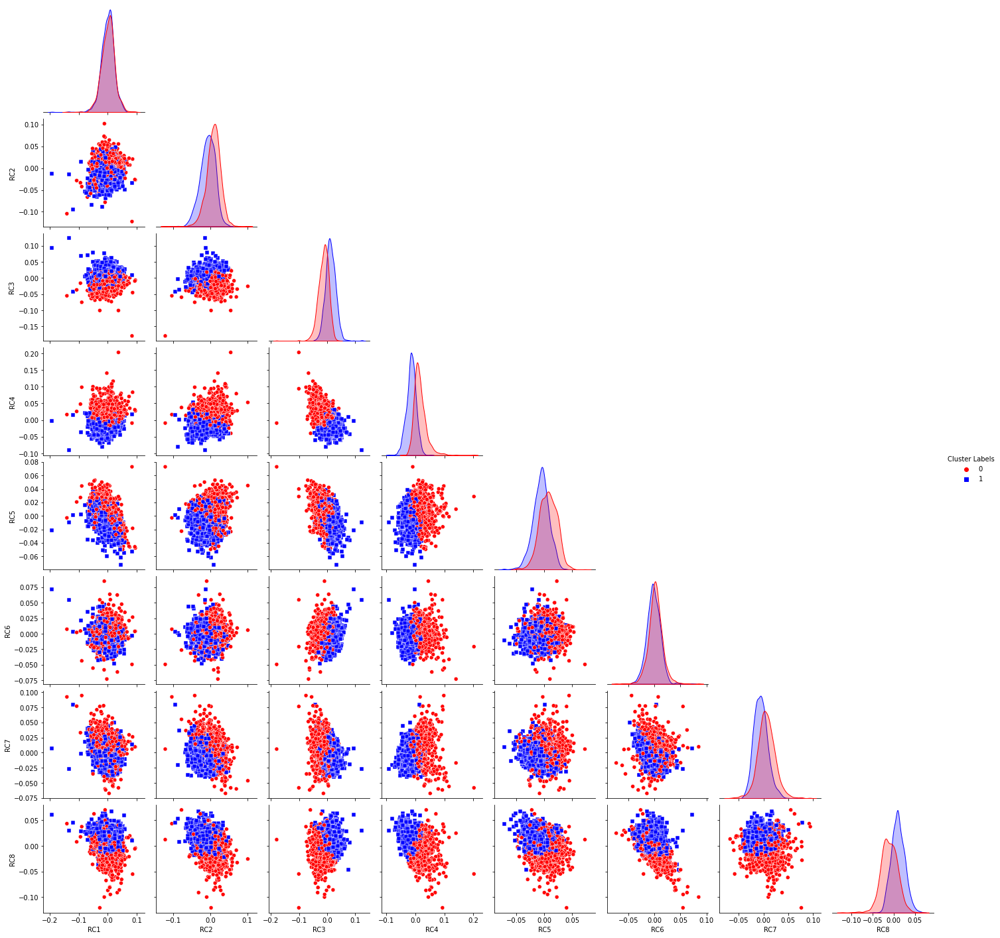

In [ ]:
import seaborn as sns

sns.pairplot(df_rca_X_optimal_viz.drop(['True Label'], axis=1), hue = 'Cluster Labels', palette= ['red', 'blue'], markers=['o', 's'], corner = True)

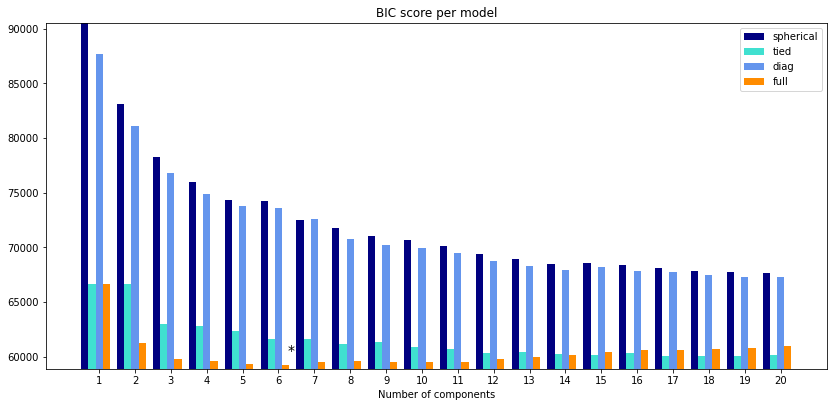

In [362]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_rca = np.infty
bic_rca = []
n_components_range_rca = range(1, 21)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_rca:
        # Fit a Gaussian mixture with EM
        gmm_rca = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_rca.fit(X_rca_optimal_transformed)
        bic_rca.append(gmm_rca.bic(X_rca_optimal_transformed))
        if bic_rca[-1] < lowest_bic_rca:
            lowest_bic_rca = bic_rca[-1]
            best_gmm_rca = gmm_rca

bic_rca = np.array(bic_rca)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_rca = best_gmm_rca
bars_rca = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_rca) + 0.2 * (i - 2)
    bars_rca.append(
        plt.bar(
            xpos,
            bic_rca[i * len(n_components_range_rca) : (i + 1) * len(n_components_range_rca)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_rca)
plt.ylim([bic_rca.min() * 1.01 - 0.01 * bic_rca.max(), bic_rca.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_rca.argmin(), len(n_components_range_rca))
    + 0.65
    + 0.2 * np.floor(bic_rca.argmin() / len(n_components_range_rca))
)
plt.text(xpos, bic_rca.min() * 0.97 + 0.03 * bic_rca.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_rca], cv_types)

In [363]:
# Choosing K=6 and covariance of "FULL" based on BIC score

gmm_optimal_rca = mixture.GaussianMixture(n_components= 6, covariance_type="full", random_state= 0)
gmm_optimal_rca.fit(X_rca_optimal_transformed)
cluster_labels_rca_optimal_gmm = gmm_optimal_rca.predict(X_rca_optimal_transformed)

In [364]:
df_rca_reduced_gmm_viz = df_X_rca_optimal_transformed.copy()
df_rca_reduced_gmm_viz['Cluster Labels'] = cluster_labels_rca_optimal_gmm

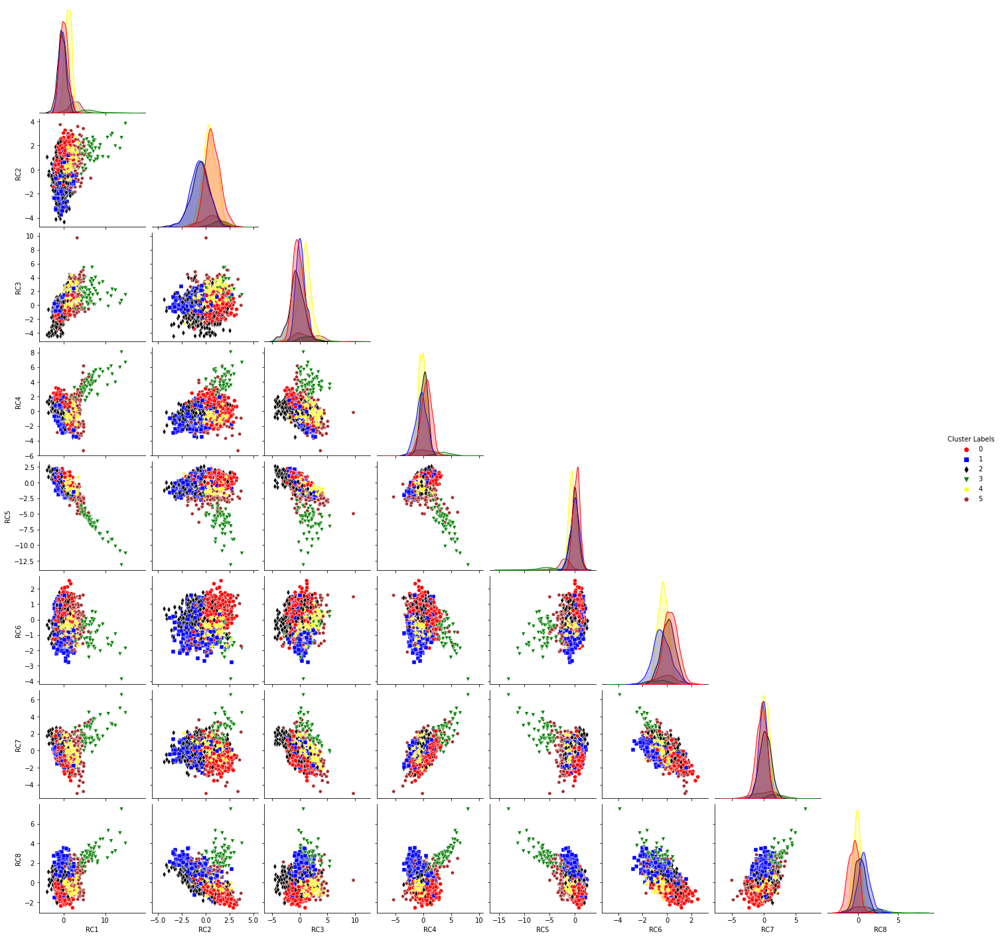

In [365]:
sns.pairplot(df_rca_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown'], markers=['o', 's', 'd', 'v', 'P', 'p'], corner = True)

**NN with RCA clsuter labels added as a feature**

In [366]:
# Adding RCA Cluster labels to features for NN

df_rca_reduced_nn = df_X_rca_optimal_transformed.copy()
df_rca_reduced_nn['Cluster Labels'] = cluster_labels_rca_optimal_gmm

In [367]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer

cat_var = ['Cluster Labels']
cat_pipeline = Pipeline(steps=[('one_hot', OneHotEncoder())])


full_preprocessor = ColumnTransformer(transformers=[('Categorical_onhot', cat_pipeline, cat_var)],remainder ='passthrough')

In [368]:
X_train_oneHot_rca = full_preprocessor.fit_transform(df_rca_reduced_nn)

In [369]:
## NN Model For PCA 
X_train_rca_cl, X_val_rca_cl, y_train_rca_cl, y_val_rca_cl = train_test_split(X_train_oneHot_rca, y_train, test_size=0.15, stratify= y_train)

In [370]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_rca_cl)
y_val_tra = le.transform(y_val_rca_cl)
y_test_tra = le.transform(y_test)

In [371]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

In [372]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [373]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [374]:
#Hyperparameters
input_size = X_train_rca_cl.shape[1]
num_classes = 7
hidden_layer = 64
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [378]:
rca_X_test_optimal = rca_optimal.transform(X_test_transformed)

In [379]:
cluster_labels_rca_optimal_gmm_X_test = gmm_optimal_rca.predict(rca_X_test_optimal)

In [380]:
df_rca_reduced_X_test = pd.DataFrame(rca_X_test_optimal, columns = ['RC1', 'RC2', 'RC3', 'RC4', 'RC5', 'RC6', 'RC7', 'RC8'])

In [384]:
cluster_labels_X_test_rca_cl = gmm_optimal_rca.predict(rca_X_test_optimal)

In [385]:
rca_reduced_X_test_nn = df_rca_reduced_X_test.copy()
rca_reduced_X_test_nn['Cluster Labels'] = cluster_labels_X_test_rca_cl
X_test_oneHot_rca = full_preprocessor.transform(rca_reduced_X_test_nn)

In [386]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_rca_cl)
X_val_tensor = torch.tensor(X_val_rca_cl)
X_test_tensor = torch.tensor(X_test_oneHot_rca)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [387]:
train_data_rca = TensorDataset(X_train_tensor, y_train_tensor)
val_data_rca = TensorDataset(X_val_tensor, y_val_tensor)
test_data_rca = TensorDataset(X_test_tensor, y_test_tensor) 

In [388]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_rca, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_rca, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_rca, batch_size = batch_size)

In [389]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [390]:
input_size

14

In [391]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [392]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 1.93
Batch # 1 Loss: 1.78
Batch # 2 Loss: 1.68
Batch # 3 Loss: 1.56
Batch # 4 Loss: 1.45
Batch # 5 Loss: 1.52
Batch # 6 Loss: 1.39
Batch # 7 Loss: 1.38
Batch # 8 Loss: 1.22
Batch # 9 Loss: 1.07
Batch # 10 Loss: 1.58
Batch # 11 Loss: 1.28
Batch # 12 Loss: 1.56
Batch # 13 Loss: 1.30
Batch # 14 Loss: 1.16
Batch # 15 Loss: 1.36
Batch # 16 Loss: 1.44
Batch # 17 Loss: 1.30
Batch # 18 Loss: 1.37
Batch # 19 Loss: 1.31
Batch # 20 Loss: 1.23
Batch # 21 Loss: 1.48
Batch # 22 Loss: 1.26
Batch # 23 Loss: 1.34
Batch # 24 Loss: 1.44
Batch # 25 Loss: 1.49
Batch # 26 Loss: 1.11
Batch # 27 Loss: 1.54
Batch # 28 Loss: 1.06
Batch # 29 Loss: 1.21
Batch # 30 Loss: 1.47
Batch # 31 Loss: 1.11
Batch # 32 Loss: 1.19
Batch # 33 Loss: 1.37
Batch # 34 Loss: 1.12
Batch # 35 Loss: 1.15
Batch # 36 Loss: 1.15
Batch # 37 Loss: 1.28
Batch # 38 Loss: 1.15
Batch # 39 Loss: 1.34
Batch # 40 Loss: 1.15
Batch # 41 Loss: 1.62
Batch # 42 Loss: 1.35
Batch # 43 Loss: 1.32
Batch # 44 Loss: 1.30
Batch # 45 Loss: 1.1

In [393]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

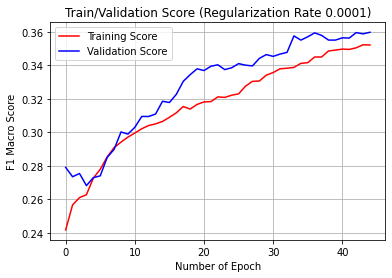

In [394]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [395]:
check_classification_report(test_data_load, model)

Got 641 / 1225 with accuracy of 52.33
Average Precision Score: 0.68
Average recall Score: 0.68
Average f1-Score: 0.31


In [396]:
check_classification_report(train_data_load, model)

Got 1773 / 3122 with accuracy of 56.79
Average Precision Score: 0.72
Average recall Score: 0.72
Average f1-Score: 0.35


In [397]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(df_X_train_transformed, y_train)
mutual_info

array([0.02969247, 0.05614368, 0.07257962, 0.08604044, 0.07141227,
       0.04696555, 0.08414726, 0.16624509, 0.025779  , 0.02733018,
       0.16865492])

In [398]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = df_X_train_transformed.columns
mutual_info.sort_values(ascending=False)

alcohol                 0.168655
density                 0.166245
residual sugar          0.086040
total sulfur dioxide    0.084147
citric acid             0.072580
chlorides               0.071412
volatile acidity        0.056144
free sulfur dioxide     0.046966
fixed acidity           0.029692
sulphates               0.027330
pH                      0.025779
dtype: float64

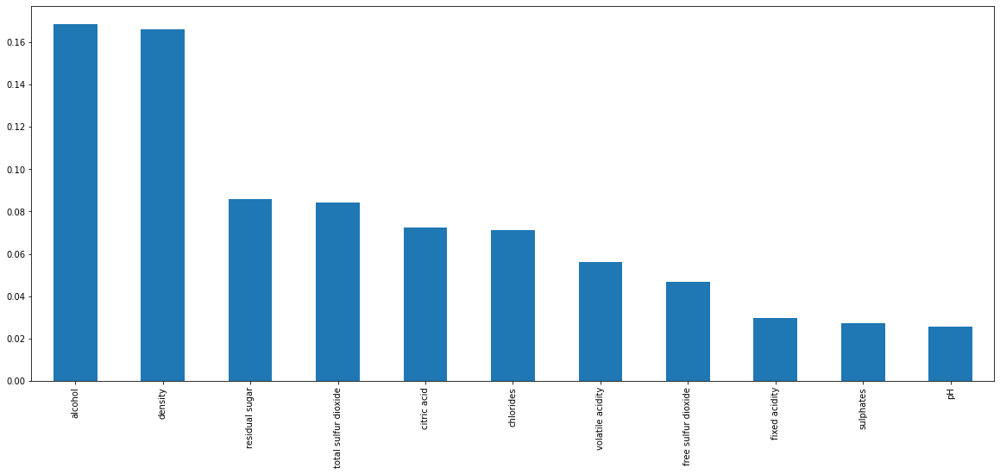

In [399]:
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))

In [400]:
from sklearn.feature_selection import SelectKBest

#Select the  top 3 important features
sel_3_cols = SelectKBest(mutual_info_classif, k=3)
sel_3_cols.fit(X_train, y_train)
X_train.columns[sel_3_cols.get_support()]

Index(['residual sugar', 'density', 'alcohol'], dtype='object')

In [508]:
from sklearn.feature_selection import SelectKBest
training_time_mi = []
#Select the  top k important features
for f in range(1, df_X_train_transformed.shape[1]+1):
  sel_3_cols = SelectKBest(mutual_info_classif, k=f)
  t_0_mi = time()
  sel_3_cols.fit(X_train, y_train)
  training_time_mi.append(time() - t_0_mi)
  X_train.columns[sel_3_cols.get_support()]

In [401]:
X_mi_optimal = df_X_train_transformed[X_train.columns[sel_3_cols.get_support()]]
X_mi_test_optiml = df_X_test_transformed[X_test.columns[sel_3_cols.get_support()]]

print(X_mi_optimal.head())
X_mi_optimal_matrix = X_mi_optimal.to_numpy() 

   residual sugar   density  alcohol
0        0.325301  0.361607    -0.45
1       -0.457831  0.178571    -0.50
2        0.734940  1.026786    -0.60
3        0.915663  1.071429    -0.65
4       -0.421687 -0.305804     0.10


In [402]:
## NN Model For MI 
X_train_mi, X_val_mi, y_train_mi, y_val_mi = train_test_split(X_mi_optimal, y_train, test_size=0.15, stratify= y_train)

In [403]:
print(y_train_mi.value_counts())
print(y_val_mi.value_counts())
print(y_test.value_counts())

6    1401
5     929
7     561
8     111
4     104
3      13
9       3
Name: quality, dtype: int64
6    247
5    164
7     99
8     20
4     18
3      2
9      1
Name: quality, dtype: int64
6    550
5    364
7    220
8     44
4     41
3      5
9      1
Name: quality, dtype: int64


In [404]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_mi)
y_val_tra = le.transform(y_val_mi)
y_test_tra = le.transform(y_test)

In [405]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5713dbeb50>,
      dtype=object)

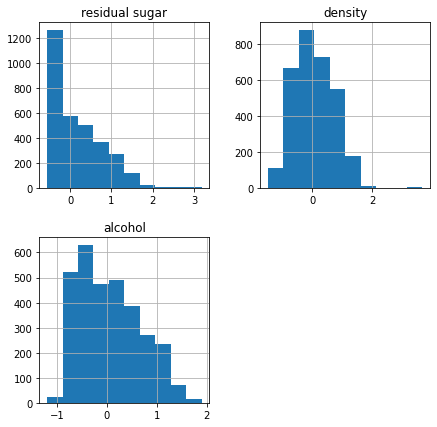

In [406]:
X_train_mi.hist(figsize=(7,7))

In [407]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score
from sklearn.utils import resample
import numpy as np

In [408]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [409]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [410]:
#Hyperparameters
input_size = X_train_mi.shape[1]
num_classes = 7
hidden_layer = 32
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [412]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_mi.values)
X_val_tensor = torch.tensor(X_val_mi.values)
X_test_tensor = torch.tensor(X_mi_test_optiml.values)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [413]:
train_data_mi = TensorDataset(X_train_tensor, y_train_tensor)
val_data_mi = TensorDataset(X_val_tensor, y_val_tensor)
test_data_mi = TensorDataset(X_test_tensor, y_test_tensor) 

In [414]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_mi, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_mi, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_mi, batch_size = batch_size)

In [415]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [418]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [419]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 2.09
Batch # 1 Loss: 2.00
Batch # 2 Loss: 1.94
Batch # 3 Loss: 1.92
Batch # 4 Loss: 1.79
Batch # 5 Loss: 1.73
Batch # 6 Loss: 1.70
Batch # 7 Loss: 1.63
Batch # 8 Loss: 1.59
Batch # 9 Loss: 1.56
Batch # 10 Loss: 1.53
Batch # 11 Loss: 1.37
Batch # 12 Loss: 1.46
Batch # 13 Loss: 1.43
Batch # 14 Loss: 1.26
Batch # 15 Loss: 1.20
Batch # 16 Loss: 1.33
Batch # 17 Loss: 1.33
Batch # 18 Loss: 1.38
Batch # 19 Loss: 1.51
Batch # 20 Loss: 1.42
Batch # 21 Loss: 1.16
Batch # 22 Loss: 1.37
Batch # 23 Loss: 1.57
Batch # 24 Loss: 1.21
Batch # 25 Loss: 1.25
Batch # 26 Loss: 1.13
Batch # 27 Loss: 1.27
Batch # 28 Loss: 1.33
Batch # 29 Loss: 1.19
Batch # 30 Loss: 1.19
Batch # 31 Loss: 1.25
Batch # 32 Loss: 1.24
Batch # 33 Loss: 1.33
Batch # 34 Loss: 1.32
Batch # 35 Loss: 1.46
Batch # 36 Loss: 1.03
Batch # 37 Loss: 1.20
Batch # 38 Loss: 1.27
Batch # 39 Loss: 1.25
Batch # 40 Loss: 1.28
Batch # 41 Loss: 1.32
Batch # 42 Loss: 1.44
Batch # 43 Loss: 1.26
Batch # 44 Loss: 1.07
Batch # 45 Loss: 1.3

In [420]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

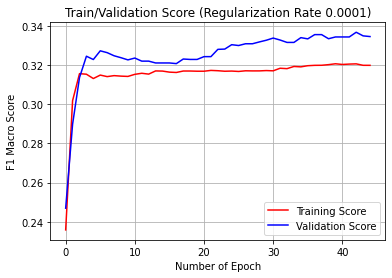

In [421]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [422]:
check_classification_report(test_data_load, model)

Got 580 / 1225 with accuracy of 47.35
Average Precision Score: 0.64
Average recall Score: 0.64
Average f1-Score: 0.28


In [423]:
check_classification_report(train_data_load, model)

Got 1587 / 3122 with accuracy of 50.83
Average Precision Score: 0.66
Average recall Score: 0.66
Average f1-Score: 0.32


For 2 number of clusters, the average Silhouette score is 0.4853120499582264
For 3 number of clusters, the average Silhouette score is 0.4233719482176328
For 4 number of clusters, the average Silhouette score is 0.3866871083961794
For 5 number of clusters, the average Silhouette score is 0.3572136459914615
For 6 number of clusters, the average Silhouette score is 0.37004349803848846
For 7 number of clusters, the average Silhouette score is 0.34561129487681286
For 8 number of clusters, the average Silhouette score is 0.3493771199795025
For 9 number of clusters, the average Silhouette score is 0.36179451646534994
For 10 number of clusters, the average Silhouette score is 0.34307508962211786
For 11 number of clusters, the average Silhouette score is 0.33792088673671405
For 12 number of clusters, the average Silhouette score is 0.328562061493655
For 13 number of clusters, the average Silhouette score is 0.31731238889784935
For 14 number of clusters, the average Silhouette score is 0.326821

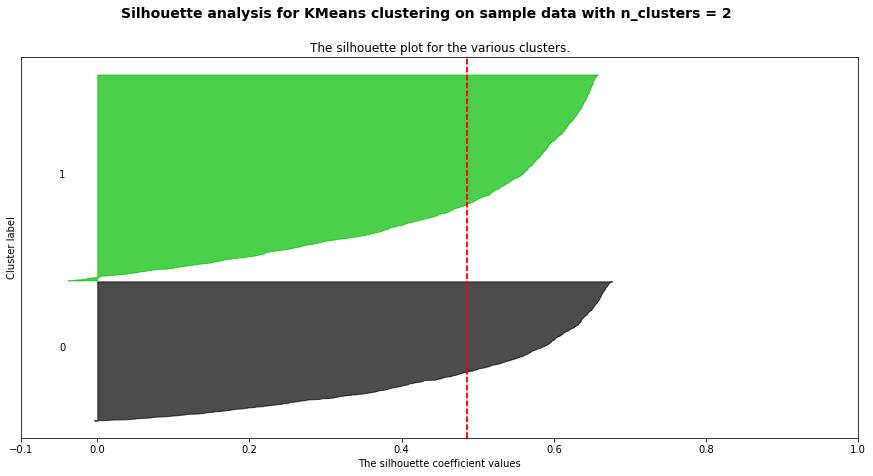

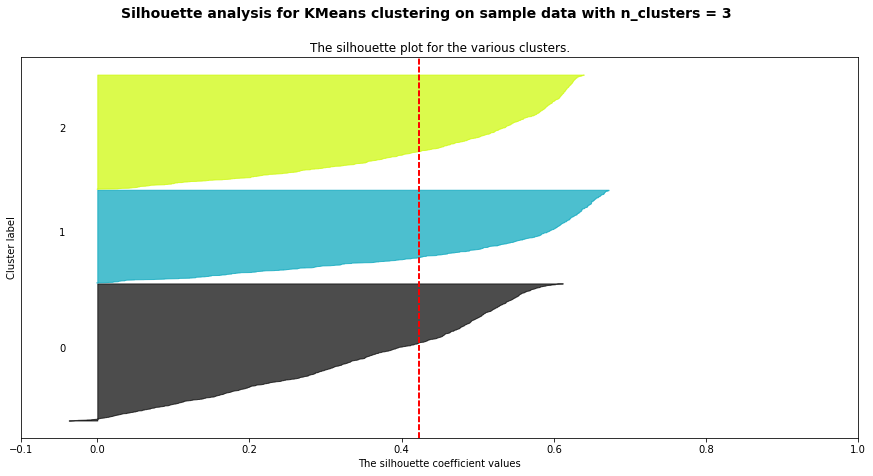

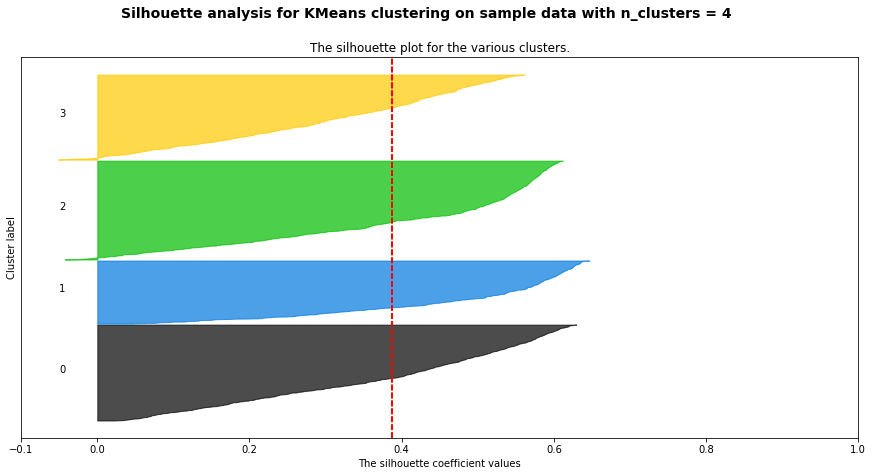

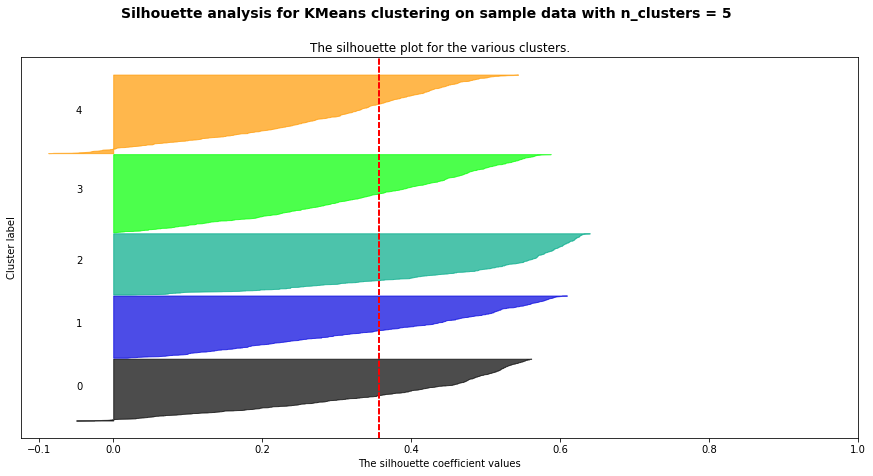

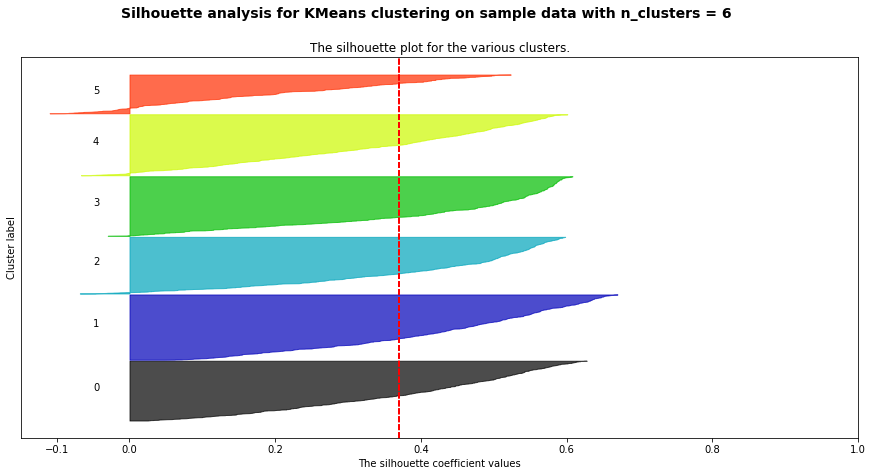

...

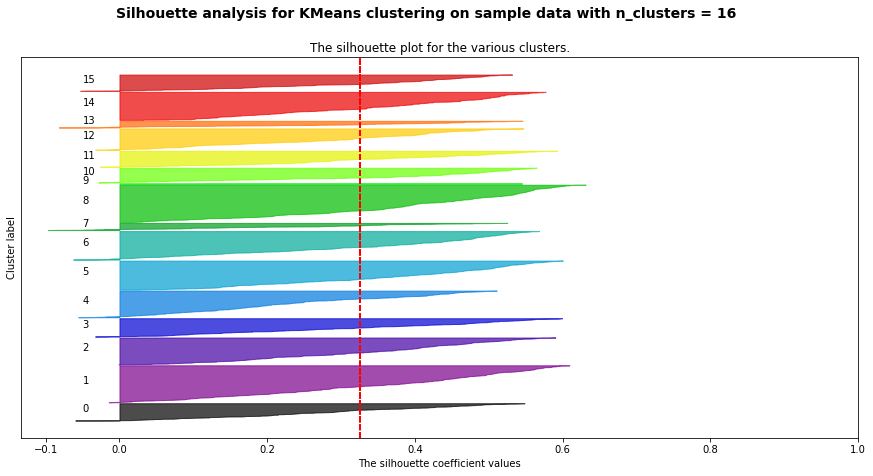

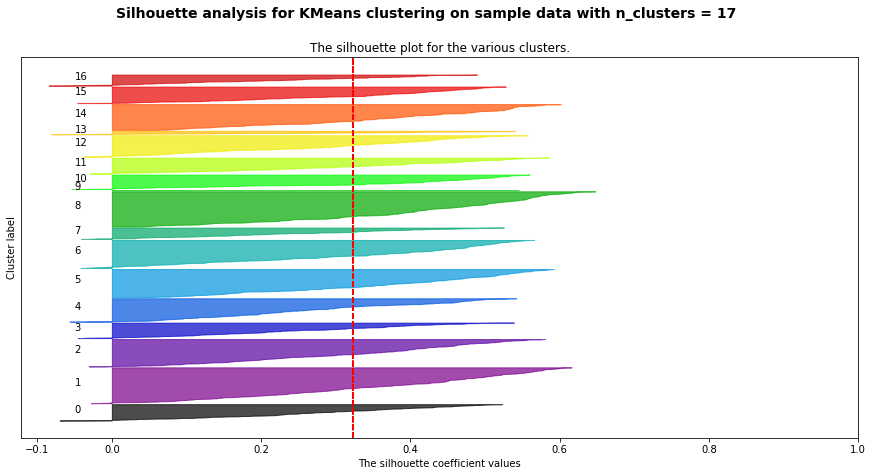

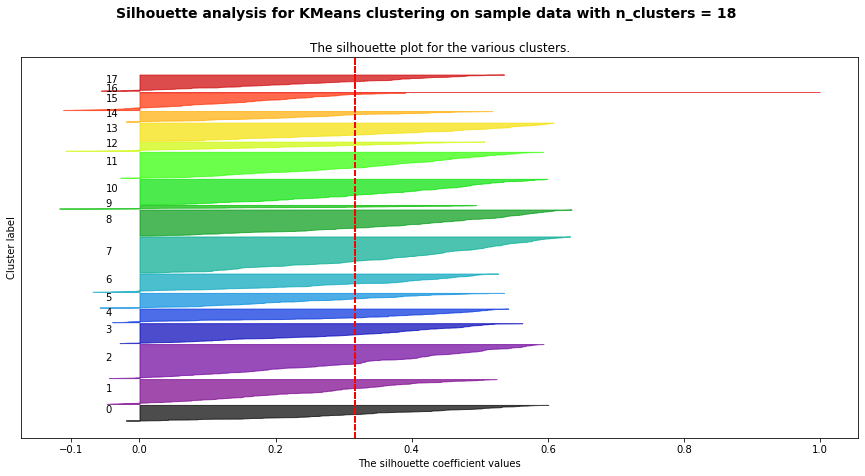

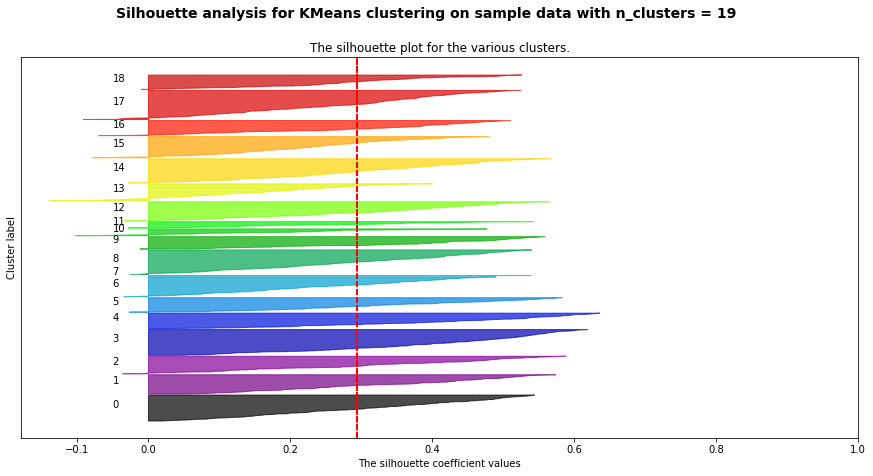

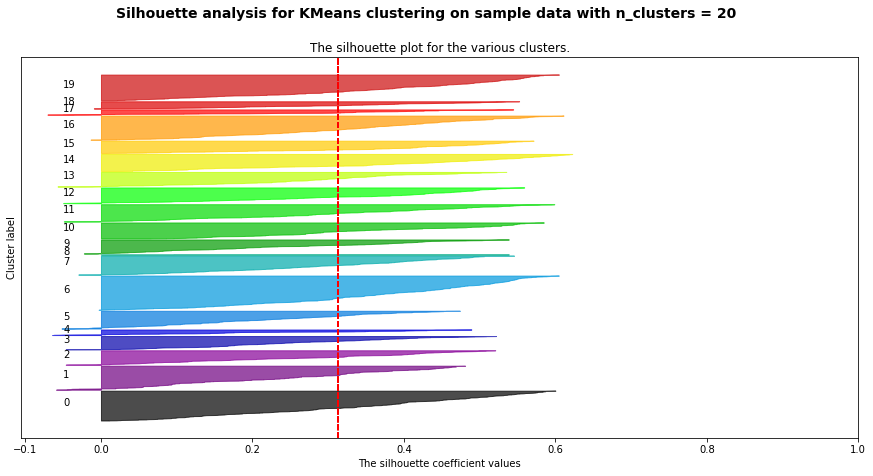

In [425]:
#Choose optimal K using Elbow and silohouette methods
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_mi = []
silhouette_avg_list_mi = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_mi = kmeans.fit_predict(X_mi_optimal)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed 
    #clusters

    silhouette_avg_mi = silhouette_score(X_mi_optimal, cluster_labels_mi)
    silhouette_avg_list_mi.append(silhouette_avg_mi)
    elbow_lost_mi.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_mi}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_mi = silhouette_samples(X_mi_optimal, cluster_labels_mi)
    
    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_mi = \
            sample_silhouette_values_mi[cluster_labels_mi == i]

      ith_cluster_silhouette_values_mi.sort()

      size_cluster_i = ith_cluster_silhouette_values_mi.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_mi,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_mi, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4) 
      
      
plt.show()

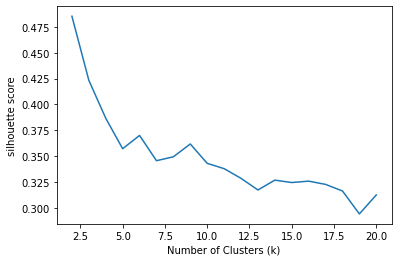

In [426]:
plt.plot(range(2,21), silhouette_avg_list_mi)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

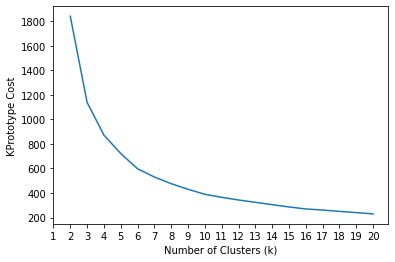

In [427]:
plt.plot(range(2,21), elbow_lost_mi)
plt.xlabel("Number of Clusters (k)")
plt.xticks(range(1, 21))
plt.ylabel("KPrototype Cost")
plt.show()

In [428]:
# Choosing K = 5 according to silhouette and Elbow method

kmeans_optimal_mi = KMeans(n_clusters = 5, random_state = 0)
kmeans_optimal_mi.fit_predict(X_mi_optimal)

array([4, 1, 2, ..., 4, 3, 3], dtype=int32)

In [ ]:
# Adding labels to X data-set
df_X_mi_optimal = pd.DataFrame(X_mi_optimal, columns = X_mi_optimal.columns)
df_X_mi_optimal['Cluster Labels'] = kmeans_optimal_mi.labels_    
df_X_mi_optimal['True Labels'] = y_train

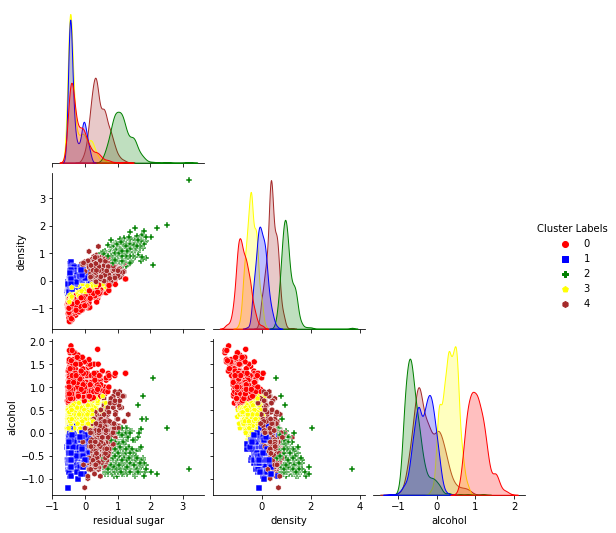

In [ ]:
import seaborn as sns

sns.pairplot(df_X_mi_optimal.drop(['True Labels'], axis=1), hue = 'Cluster Labels', palette= ['red', 'blue', 'green', 'yellow', 'brown'], markers=['o', 's', 'P', 'p', 'h'], corner = True)

In [429]:
# Adding MI Cluster labels to features for NN

df_mi_reduced_nn = X_mi_optimal.copy()
df_mi_reduced_nn['Cluster Labels'] = kmeans_optimal_mi.labels_ 

In [430]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer

cat_var = ['Cluster Labels']
cat_pipeline = Pipeline(steps=[('one_hot', OneHotEncoder())])


full_preprocessor = ColumnTransformer(transformers=[('Categorical_onhot', cat_pipeline, cat_var)],remainder ='passthrough')

In [431]:
X_train_oneHot_mi = full_preprocessor.fit_transform(df_mi_reduced_nn)

In [432]:
## NN Model For PCA 
X_train_mi_cl, X_val_mi_cl, y_train_mi_cl, y_val_mi_cl = train_test_split(X_train_oneHot_mi, y_train, test_size=0.15, stratify= y_train)

In [433]:
#Label encoding
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
_ = le.fit(y_train)
y_train_tra = le.transform(y_train_mi_cl)
y_val_tra = le.transform(y_val_mi_cl)
y_test_tra = le.transform(y_test)

In [434]:
le.classes_

array([3, 4, 5, 6, 7, 8, 9])

In [435]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [436]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [452]:
#Hyperparameters
input_size = X_train_mi_cl.shape[1]
num_classes = 7
hidden_layer = 64
learning_rate = 0.005
batch_size = 32
num_epochs = 45
regularization_rate = 0.0001

In [438]:
mi_X_test_optimal = X_mi_test_optiml

In [442]:
mi_X_test_optimal

,residual sugar,density,alcohol
0,-0.481928,-1.031250,1.00
1,-0.409639,-0.580357,1.10
2,0.174699,-0.281250,0.35
3,-0.403614,-0.924107,0.70
4,-0.361446,0.937500,-0.35
...,...,...,...
1220,1.126506,1.261161,-0.65
1221,0.602410,0.198661,0.25
1222,1.078313,1.026786,-0.55
1223,-0.132530,-0.709821,0.65


In [439]:
cluster_labels_mi_optimal_kmeans_X_test = kmeans_optimal_mi.predict(mi_X_test_optimal)

In [443]:
mi_reduced_X_test_nn = mi_X_test_optimal.copy()
mi_reduced_X_test_nn['Cluster Labels'] = cluster_labels_mi_optimal_kmeans_X_test
X_test_oneHot_mi = full_preprocessor.transform(mi_reduced_X_test_nn)

In [444]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_mi_cl)
X_val_tensor = torch.tensor(X_val_mi_cl)
X_test_tensor = torch.tensor(X_test_oneHot_mi)
y_train_tensor = torch.tensor(y_train_tra)
y_val_tensor = torch.tensor(y_val_tra)
y_test_tensor = torch.tensor(y_test_tra)

In [445]:
train_data_mi = TensorDataset(X_train_tensor, y_train_tensor)
val_data_mi = TensorDataset(X_val_tensor, y_val_tensor)
test_data_mi = TensorDataset(X_test_tensor, y_test_tensor) 

In [446]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_mi, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_mi, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_mi, batch_size = batch_size)

In [450]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [451]:
input_size

8

In [456]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [457]:
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()

    
    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 1.97
Batch # 1 Loss: 1.77
Batch # 2 Loss: 1.72
Batch # 3 Loss: 1.43
Batch # 4 Loss: 1.40
Batch # 5 Loss: 1.51
Batch # 6 Loss: 1.29
Batch # 7 Loss: 1.19
Batch # 8 Loss: 1.30
Batch # 9 Loss: 1.08
Batch # 10 Loss: 1.40
Batch # 11 Loss: 1.46
Batch # 12 Loss: 1.55
Batch # 13 Loss: 1.47
Batch # 14 Loss: 1.20
Batch # 15 Loss: 1.08
Batch # 16 Loss: 1.27
Batch # 17 Loss: 1.23
Batch # 18 Loss: 1.35
Batch # 19 Loss: 1.31
Batch # 20 Loss: 1.33
Batch # 21 Loss: 1.72
Batch # 22 Loss: 1.14
Batch # 23 Loss: 1.36
Batch # 24 Loss: 1.18
Batch # 25 Loss: 1.32
Batch # 26 Loss: 1.21
Batch # 27 Loss: 1.02
Batch # 28 Loss: 1.24
Batch # 29 Loss: 1.34
Batch # 30 Loss: 1.32
Batch # 31 Loss: 1.44
Batch # 32 Loss: 1.20
Batch # 33 Loss: 1.17
Batch # 34 Loss: 1.14
Batch # 35 Loss: 0.89
Batch # 36 Loss: 1.27
Batch # 37 Loss: 1.21
Batch # 38 Loss: 1.24
Batch # 39 Loss: 1.48
Batch # 40 Loss: 1.26
Batch # 41 Loss: 1.24
Batch # 42 Loss: 1.39
Batch # 43 Loss: 1.28
Batch # 44 Loss: 1.13
Batch # 45 Loss: 1.4

In [458]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

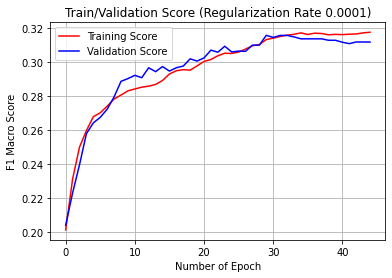

In [459]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [460]:
check_classification_report(test_data_load, model)

Got 585 / 1225 with accuracy of 47.76
Average Precision Score: 0.65
Average recall Score: 0.65
Average f1-Score: 0.28


In [462]:
check_classification_report(train_data_load, model)

Got 1563 / 3122 with accuracy of 50.06
Average Precision Score: 0.65
Average recall Score: 0.65
Average f1-Score: 0.32


Text(0.5, 1.0, 'Running Time Analysis of Dimensionality Reduction Algorithms')

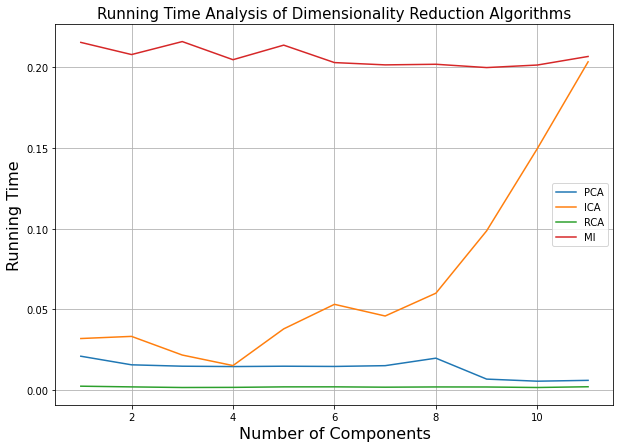

In [511]:
x = range(1,df_X_train_transformed.shape[1] + 1)
figure(figsize=(10,7))
plt.grid()
plt.plot(x, training_time_pca, label ='PCA')
plt.plot(x, training_time_ica, label= 'ICA')
plt.plot(x, training_time_rca, label = 'RCA')
plt.plot(x, training_time_mi, label= 'MI')
plt.legend()
plt.xlabel('Number of Components', fontsize = 16)
plt.ylabel('Running Time', fontsize=16)
plt.title('Running Time Analysis of Dimensionality Reduction Algorithms', fontsize=15)